# Business understanding

A multinational retail company decides to embark on a campaign called Operation  Increase Sales and Profit (OISP) which focuses on increasing the sales of the company and maximising profit. 
 
Before the management team of the company can take any actionable decision with regards to the campaign,they want to draw the necessary insight from their sitting data.
    
As their Data Analyst, we were presented with their four year daily sales records (*superstore data.csv*),
    
We  analyse the given  data and advise management on what to do to increase sales and profit as intended in the compaign.
   
Our analytical steps was inlined with CRISP-DM(Cross Industry Standard Process for Data Mining)steps, by asking the nescessary questions and providing answers based on the data.

# Problem Statement
Our data is from a multinational retail company decides to embark on a campaign called Operation Increase Sales and Profit' (OISP) which focuses on increasing the sales of the company and maximising profit.

We examine the best performing market making the most sales and profit as well as the worst performing market making the least sales and loses. Focusing on the best and worse performing market, we will examine the countries that had the most sales and gave the highest profit. Conversely, countries with the least sales and loses will be explored.

The contributions of the product category and the segment to the profit and sales in both the best and worse performing market will also be investigated. We will also investigate whether discount has a significant effect on sales in both the best and worse performing market.

 These questions will be explored in the analysis;

1. The best and worse performing markets in terms of sales and profit.

2. The top and bottom countries making the most sales as well as the least sales in the best and worse performing market. 

3. The top and bottom countries making the most profit as well as the least profit in the best and worse performing market.
 
3. Top selling product category in the best and worse performing market.

4. The top product category making the most profit in the best and worse performing market.

5. The segment making the most sales in the best and worse performing market.

6. The segment making the most profit in the best and worse performing market.


We will use numpy, pandas, seaborn and matplotlib to asses the data, clean and create meaningful visuals to interpret our findings.


# Data understanding

In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

In [2]:
#import data
sales_df = pd.read_csv('superstore.csv', encoding='ISO-8859-1')

In [3]:
#displaying first five rows of the dataframe
sales_df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,42433,AG-2011-2040,1/1/2011,6/1/2011,Standard Class,TB-11280,Toby Braunhardt,Consumer,Constantine,Constantine,...,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",408.300,2,0.0,106.140,35.46,Medium
1,22253,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.366,3,0.1,36.036,9.72,Medium
2,48883,HU-2011-1220,1/1/2011,5/1/2011,Second Class,AT-735,Annie Thurman,Consumer,Budapest,Budapest,...,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",66.120,4,0.0,29.640,8.17,High
3,11731,IT-2011-3647632,1/1/2011,5/1/2011,Second Class,EM-14140,Eugene Moren,Home Office,Stockholm,Stockholm,...,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",44.865,3,0.5,-26.055,4.82,High
4,22255,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.670,5,0.1,37.770,4.70,Medium


In [4]:
#displaying last five rows of the dataframe
sales_df.tail()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
51285,32593,CA-2014-115427,31-12-2014,4/1/2015,Standard Class,EB-13975,Erica Bern,Corporate,Fairfield,California,...,OFF-BI-10002103,Office Supplies,Binders,"Cardinal Slant-D Ring Binder, Heavy Gauge Vinyl",13.904,2,0.2,4.5188,0.89,Medium
51286,47594,MO-2014-2560,31-12-2014,5/1/2015,Standard Class,LP-7095,Liz Preis,Consumer,Agadir,Souss-Massa-Draâ,...,OFF-WIL-10001069,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",3.990,1,0.0,0.4200,0.49,Medium
51287,8857,MX-2014-110527,31-12-2014,2/1/2015,Second Class,CM-12190,Charlotte Melton,Consumer,Managua,Managua,...,OFF-LA-10004182,Office Supplies,Labels,"Hon Color Coded Labels, 5000 Label Set",26.400,3,0.0,12.3600,0.35,Medium
51288,6852,MX-2014-114783,31-12-2014,6/1/2015,Standard Class,TD-20995,Tamara Dahlen,Consumer,Juárez,Chihuahua,...,OFF-LA-10000413,Office Supplies,Labels,"Hon Legal Exhibit Labels, Alphabetical",7.120,1,0.0,0.5600,0.20,Medium
51289,36388,CA-2014-156720,31-12-2014,4/1/2015,Standard Class,JM-15580,Jill Matthias,Consumer,Loveland,Colorado,...,OFF-FA-10003472,Office Supplies,Fasteners,Bagged Rubber Bands,3.024,3,0.2,-0.6048,0.17,Medium


In [5]:
# Checking how many rows and columns are in the data
sales_df.shape

(51290, 24)

In [6]:
#Checking the columns in the data
sales_df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'City', 'State', 'Country',
       'Postal Code', 'Market', 'Region', 'Product ID', 'Category',
       'Sub-Category', 'Product Name', 'Sales', 'Quantity', 'Discount',
       'Profit', 'Shipping Cost', 'Order Priority'],
      dtype='object')

In [7]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Row ID          51290 non-null  int64  
 1   Order ID        51290 non-null  object 
 2   Order Date      51290 non-null  object 
 3   Ship Date       51290 non-null  object 
 4   Ship Mode       51290 non-null  object 
 5   Customer ID     51290 non-null  object 
 6   Customer Name   51290 non-null  object 
 7   Segment         51290 non-null  object 
 8   City            51290 non-null  object 
 9   State           51290 non-null  object 
 10  Country         51290 non-null  object 
 11  Postal Code     9994 non-null   float64
 12  Market          51290 non-null  object 
 13  Region          51290 non-null  object 
 14  Product ID      51290 non-null  object 
 15  Category        51290 non-null  object 
 16  Sub-Category    51290 non-null  object 
 17  Product Name    51290 non-null 

In [8]:
# Summary statistics on the data
sales_df.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit,Shipping Cost
count,51290.00000,9994.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,25645.50000,55190.379428,246.490581,3.476545,0.142908,28.610982,26.375915
std,14806.29199,32063.693350,487.565361,2.278766,0.212280,174.340972,57.296804
min,1.00000,1040.000000,0.444000,1.000000,0.000000,-6599.978000,0.000000
25%,12823.25000,23223.000000,30.758625,2.000000,0.000000,0.000000,2.610000
50%,25645.50000,56430.500000,85.053000,3.000000,0.000000,9.240000,7.790000
75%,38467.75000,90008.000000,251.053200,5.000000,0.200000,36.810000,24.450000
max,51290.00000,99301.000000,22638.480000,14.000000,0.850000,8399.976000,933.570000


In [9]:
sales_df.describe(include = "object")

,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,Country,Market,Region,Product ID,Category,Sub-Category,Product Name,Order Priority
count,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290
unique,25035,1430,1464,4,1590,795,3,3636,1094,147,7,13,10292,3,17,3788,4
top,CA-2014-100111,18-06-2014,22-11-2014,Standard Class,PO-18850,Muhammed Yedwab,Consumer,New York City,California,United States,APAC,Central,OFF-AR-10003651,Office Supplies,Binders,Staples,Medium
freq,14,135,130,30775,97,108,26518,915,2001,9994,11002,11117,35,31273,6152,227,29433


In [10]:
# Check for duplicates in the data
sales_df.duplicated().sum()

0

In [11]:
# copying data
clean_sales_df = sales_df.copy()
#confirming copy
clean_sales_df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,42433,AG-2011-2040,1/1/2011,6/1/2011,Standard Class,TB-11280,Toby Braunhardt,Consumer,Constantine,Constantine,...,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",408.300,2,0.0,106.140,35.46,Medium
1,22253,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.366,3,0.1,36.036,9.72,Medium
2,48883,HU-2011-1220,1/1/2011,5/1/2011,Second Class,AT-735,Annie Thurman,Consumer,Budapest,Budapest,...,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",66.120,4,0.0,29.640,8.17,High
3,11731,IT-2011-3647632,1/1/2011,5/1/2011,Second Class,EM-14140,Eugene Moren,Home Office,Stockholm,Stockholm,...,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",44.865,3,0.5,-26.055,4.82,High
4,22255,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.670,5,0.1,37.770,4.70,Medium


Data has been successfully copied, now let's clean the data. Firstly, we will delete the `Postal Code` column because it has 41296 null values and we believe in won't be necessary in our analysis.

In [12]:
# dropping column
clean_sales_df.drop('Postal Code',axis = 1, inplace=True)

We will confirm drop by checking the columns in the dataframe

In [13]:
# checking columns
clean_sales_df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'City', 'State', 'Country',
       'Market', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'Shipping Cost', 'Order Priority'],
      dtype='object')

In [14]:
# checking for null
clean_sales_df.isnull().sum()

Row ID            0
Order ID          0
Order Date        0
Ship Date         0
Ship Mode         0
Customer ID       0
Customer Name     0
Segment           0
City              0
State             0
Country           0
Market            0
Region            0
Product ID        0
Category          0
Sub-Category      0
Product Name      0
Sales             0
Quantity          0
Discount          0
Profit            0
Shipping Cost     0
Order Priority    0
dtype: int64

After deleting the column with multiple null vlaues, there are no more null values in the data.

In [15]:
# Convert the Order Priority column to a category and Order Date column to a date
clean_sales_df["Order Priority"]= clean_sales_df["Order Priority"].astype("category")
clean_sales_df["Order Date"] = clean_sales_df["Order Date"].astype("datetime64[ns]")

C:\Users\ayers\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1063: UserWarning: Parsing '13-01-2011' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\ayers\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1063: UserWarning: Parsing '13-01-2012' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\ayers\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1063: UserWarning: Parsing '13-01-2013' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
C:\Users\ayers\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1063: UserWarning: Parsing '13-01-2014' in DD/MM/YYYY format. Provide format or specif

In [16]:
# checking data type of column
clean_sales_df[["Order Priority","Order Date"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Order Priority  51290 non-null  category      
 1   Order Date      51290 non-null  datetime64[ns]
dtypes: category(1), datetime64[ns](1)
memory usage: 451.1 KB


The datatype of the columns has succesfully been changed to the appropriate type.

After cleaning the data, we will proceed to analyze the data.

### Data Analysis

In [17]:
df = clean_sales_df.copy()

We will start by checking the distribution of sales and profit in the data

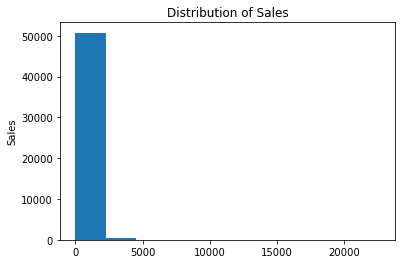

In [18]:
# plotting distribution of sales
plt.hist(data=df,x="Sales")
plt.title('Distribution of Sales')
plt.ylabel('Sales')
plt.show()

There seems to be outliers in the dataset affecting the distribution. We will identify these outliers using the interquartile range. To do this we will need the first and third quartiles.

In [19]:
# summary statistics of sales column
df["Sales"].describe()

count    51290.000000
mean       246.490581
std        487.565361
min          0.444000
25%         30.758625
50%         85.053000
75%        251.053200
max      22638.480000
Name: Sales, dtype: float64

first quartile is 30 and third quartile is 251

In [20]:
q1, q3= np.percentile(df['Sales'],[25,75])
iqr = q3 - q1

low_bound= q1 - (iqr * 1.5)
print(f' lower bound = {low_bound}')

upper_bound= q3 + (iqr * 1.5)
print(f' Upper bound = {upper_bound}')


 lower bound = -299.6832375
 Upper bound = 581.4950625


In [21]:
# checking for high boundary outliers
df.query('Sales >= 581').count()[0]

5658

In [22]:
# checking for low boundary outliers
df.query('Sales <= -299').count()[0]

0

There are 5658 outliers in the sales column. We will maintain these values because they will be relevant to our analysis and dropping them would mean removing our best performing sales values.

Now we will check the distribution of profits.

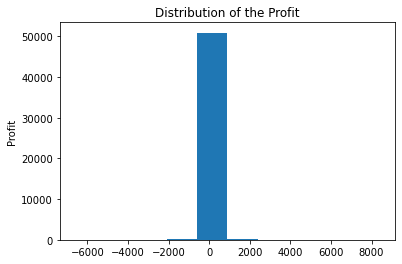

In [23]:
plt.hist(data=df,x="Profit")
plt.title('Distribution of the Profit')
plt.ylabel('Profit')
plt.show()

There seems to be outliers in the profit column as well. We will investigate this further.Once again, we will use the interquartile range.

In [24]:
# summary stats on profit column
df[['Profit']].describe()

,Profit
count,51290.000000
mean,28.610982
std,174.340972
min,-6599.978000
25%,0.000000
50%,9.240000
75%,36.810000
max,8399.976000


first quartile: 0.00

third quartile: 36.81

In [25]:
# checking for low outliers
df.query('Profit <= -55.215').count()[0]

3526

In [26]:
# checking for high outliers
df.query('Profit >= 92').count()[0]

6229

There are outliers in the profit column as well. We will work with these outliers because they indicate areas of high profit and heavy losses. We will inspect the value counts of the markets in the dataframe

In [27]:
# value counts of market column
df['Market'].value_counts()

APAC      11002
LATAM     10294
EU        10000
US         9994
EMEA       5029
Africa     4587
Canada      384
Name: Market, dtype: int64

We'll plot this on a bar chart.

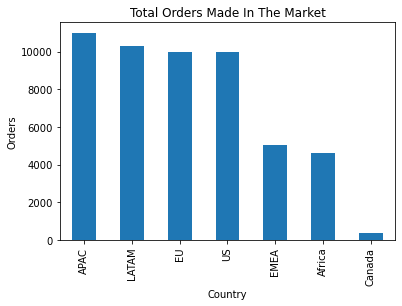

In [28]:
df.Market.value_counts().plot(kind='bar')
plt.title('Total Orders Made In The Market')
plt.xlabel('Country')
plt.ylabel('Orders')
plt.show()

From the bar chart, we discovered that APAC is the market with the most orders whiles Canada is the market with the least orders. We will analyze the markets in terms of sales and profit.

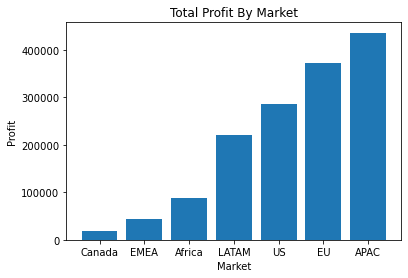

In [29]:
pro = df.groupby('Market')['Profit'].sum().sort_values(ascending=True)
plt.bar(pro.index,pro)
plt.title('Total Profit By Market')
plt.xlabel('Market')
plt.ylabel('Profit')
plt.show()

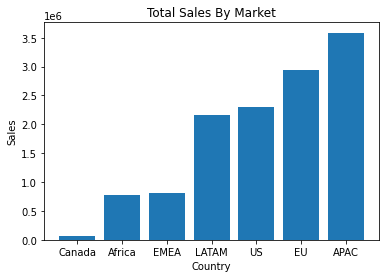

In [30]:
sls = df.groupby('Market')['Sales'].sum().sort_values(ascending=True)
plt.bar(sls.index,sls)
plt.title('Total Sales By Market')
plt.xlabel('Country')
plt.ylabel('Sales')
plt.show()

The APAC market is not only the market with the highest orders but also the market with the highest sales and profit. Conversely, Canada is the market with the least sales and profit.

We will dive deeper into the markets.

### APAC market analysis

We will extract the orders in the APAC market into a separate dataframe.

In [31]:
apac_df = df.query('Market == "APAC"')
apac_df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
1,22253,IN-2011-47883,2011-01-01,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.366,3,0.10,36.036,9.72,Medium
4,22255,IN-2011-47883,2011-01-01,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.670,5,0.10,37.770,4.70,Medium
5,22254,IN-2011-47883,2011-01-01,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,...,OFF-PA-10001968,Office Supplies,Paper,"Eaton Computer Printout Paper, 8.5 x 11",55.242,2,0.10,15.342,1.80,Medium
6,21613,IN-2011-30733,2011-01-02,3/2/2011,Second Class,PO-18865,Patrick O'Donnell,Consumer,Dhaka,Dhaka,...,TEC-CO-10002316,Technology,Copiers,"Brother Personal Copier, Laser",285.780,2,0.00,71.400,57.30,Critical
9,23688,ID-2011-56493,2011-01-02,3/2/2011,Second Class,SP-20650,Stephanie Phelps,Corporate,Yingcheng,Hubei,...,OFF-ST-10002161,Office Supplies,Storage,"Tenex Trays, Single Width",162.720,3,0.00,68.310,44.36,Critical
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51270,27701,IN-2014-23754,2014-12-31,7/1/2015,Standard Class,KM-16225,Kalyca Meade,Corporate,Shantou,Guangdong,...,OFF-EN-10002630,Office Supplies,Envelopes,"Ames Business Envelopes, Recycled",67.200,5,0.00,24.750,4.06,Medium
51271,23682,IN-2014-75603,2014-12-31,5/1/2015,Second Class,BS-11365,Bill Shonely,Corporate,Vijayawada,Andhra Pradesh,...,OFF-ST-10001824,Office Supplies,Storage,"Rogers Box, Single Width",72.000,3,0.00,4.320,3.88,Medium
51275,28569,ID-2014-54442,2014-12-31,4/1/2015,Standard Class,MY-18295,Muhammed Yedwab,Corporate,Manila,National Capital,...,TEC-AC-10002221,Technology,Accessories,"Memorex Mouse, Bluetooth",61.974,4,0.45,-37.266,3.18,Medium
51276,23683,IN-2014-75603,2014-12-31,5/1/2015,Second Class,BS-11365,Bill Shonely,Corporate,Vijayawada,Andhra Pradesh,...,OFF-FA-10000263,Office Supplies,Fasteners,"Stockwell Thumb Tacks, Bulk Pack",39.420,3,0.00,17.280,2.97,Medium


In [32]:
apac_sales = apac_df['Sales'].sum()
print('Total sales in APAC: {:.2f}'.format(apac_sales))

Total sales in APAC: 3585744.13


In [33]:
apac_pro = apac_df['Profit'].sum()
print('Total profit in APAC: {:.2f}'.format(apac_pro))

Total profit in APAC: 436000.05


We will now breakdown the APAC market into countries to assess the impact the countries are having on sales and profit in the APAC market.

We start by checking the number of orders per country.

In [34]:
apac_df['Country'].value_counts()

Australia           2837
China               1880
India               1555
Indonesia           1390
Philippines          681
New Zealand          628
Thailand             295
Vietnam              265
Japan                250
Pakistan             249
Malaysia             176
South Korea          172
Bangladesh           163
Singapore            141
Myanmar (Burma)      136
Afghanistan           55
Cambodia              45
Papua New Guinea      22
Hong Kong             21
Nepal                 19
Taiwan                14
Sri Lanka              7
Mongolia               1
Name: Country, dtype: int64

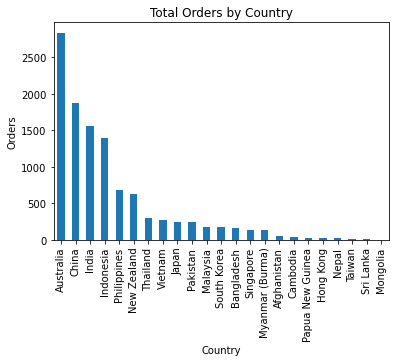

In [35]:
apac_df['Country'].value_counts().plot(kind='bar')
plt.title("Total Orders by Country")
plt.xlabel("Country")
plt.ylabel("Orders");

In the APAC market, China is the country with the most orders while Mongolia is the country with the least orders. We will proceed to investigate the top 5 countries and bottom 5 countries in terms of sales and profit.

##### Top 5 countries by sales

In [36]:
sales_top_5 = apac_df.groupby('Country')['Sales'].sum().nlargest(5)
apac_top_5 = sales_top_5.sort_values(ascending=True)
apac_top_5

Country
Philippines    183420.1650
Indonesia      404887.4979
India          589650.1050
China          700562.0250
Australia      925235.8530
Name: Sales, dtype: float64

We will plot this on a bar chart. We will first create a function that plot vertical and horizontal bar charts.

In [37]:
# creating function to plot bar charts
def plot_bar(types, index, values, title, tick, label, labelx, labely):
    if types == 'barh':
        plt.barh(index, values)
        plt.xticks(ticks = tick,
        labels = label)
    elif types == 'bar':
        plt.bar(index, values)
        plt.yticks(ticks = tick,
        labels = label)
        plt.xticks(rotation= 45) 
    plt.title(title)
    plt.xlabel(labelx)
    plt.ylabel(labely)
    plt.show()

We will now use the function to plot a horizontal bar chart for the top 5 APAC countries by sales.

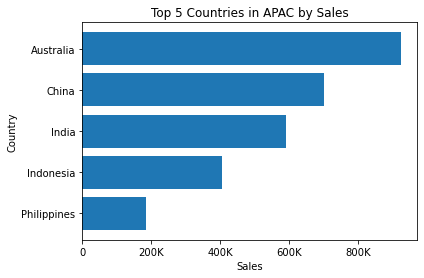

In [38]:
plot_bar(types = 'barh',
        index = apac_top_5.index,
        values = apac_top_5,
        title = "Top 5 Countries in APAC by Sales",
        tick = (0,200000,400000,600000,800000),
        label = ('0','200K','400K','600K','800K'),
        labelx = "Sales",
        labely = "Country")

Australia, China, India, Indonesia and Philippines are the best performing countries in the APAC region in terms of sales. We will investigate the best performing countries in terms of profit.

##### Top 5 APAC Countries by Profit

In [39]:
profit_top_5 = apac_df.groupby('Country')['Profit'].sum().nlargest(5)
apac_top_5_profit = profit_top_5.sort_values(ascending=True).to_frame()
apac_top_5_profit

,Profit
Country,
Bangladesh,19430.890
Japan,24328.467
Australia,103907.433
India,129071.835
China,150683.085


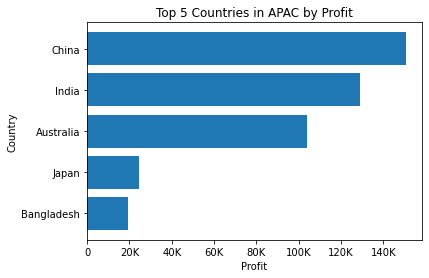

In [40]:
plot_bar(types = 'barh',
        index = apac_top_5_profit.index,
        values = apac_top_5_profit['Profit'],
        title = "Top 5 Countries in APAC by Profit",
        tick = (0,20000,40000,60000,80000,100000,120000,140000),
        label = ('0','20K','40K','60K','80K','100K','120K','140K'),
        labelx = "Profit",
        labely = "Country")

China, India, Australia, Japan and Bangladesh are the best performing countries in APAC in terms of profit.

We will check the best performing segments and categories in the APAC region by sales and profit.

In [41]:
apac_segs_sales = apac_df.groupby('Segment')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
apac_segs_sales

,Sales
Segment,
Consumer,1816753.70
Corporate,1078466.31
Home Office,690524.11


We will check the segments by profit before plotting the visuals.

In [42]:
apac_segs_pro = apac_df.groupby('Segment')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
apac_segs_pro

,Profit
Segment,
Consumer,222817.56
Corporate,129737.23
Home Office,83445.25


In [43]:
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(apac_segs_sales['Sales'],
        autopct='%.1f%%',
        labels=apac_segs_sales.index)
plt.title("Sales in the APAC Market")


plt.subplot(1,2,2)
plt.pie(apac_segs_pro['Profit'],
        autopct='%.1f%%',
        labels=apac_segs_pro.index)
plt.title("Profit in the APAC Market")
plt.show()

In terms of profit and sales, Consumer is the best performing Segment in the APAC market. This is followed by the Corporate segment then the Home Office Segment. 

We will now look at the categories in terms of profit and sales.

In [44]:
apac_cat_sales = apac_df.groupby('Category')['Sales'].sum().sort_values().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
apac_cat_sales

,Sales
Category,
Office Supplies,884319.83
Furniture,1343934.07
Technology,1357490.23


In [45]:
apac_cat_pro = apac_df.groupby('Category')['Profit'].sum().sort_values().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
apac_cat_pro

,Profit
Category,
Office Supplies,105510.04
Furniture,125896.15
Technology,204593.86


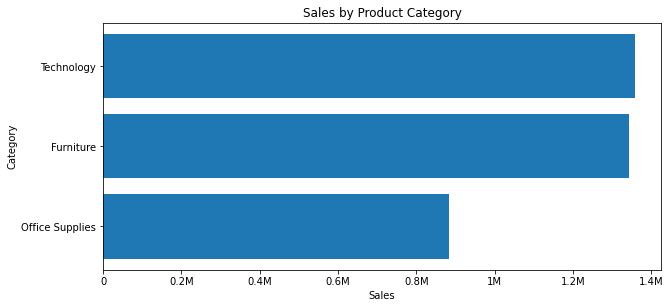

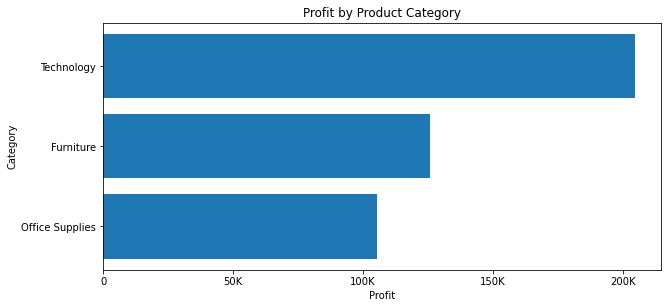

In [46]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = apac_cat_sales.index,
    values = apac_cat_sales['Sales'],
    title = "Sales by Product Category",
        tick = (0,200000,400000,600000,800000,1000000,1200000,1400000),
        label = ('0','0.2M','0.4M','0.6M','0.8M','1M','1.2M','1.4M'),
        labelx = 'Sales',
        labely = "Category"
)


plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = apac_cat_pro.index,
    values = apac_cat_pro['Profit'],
    title = "Profit by Product Category",
        tick = (0,50000,100000,150000,200000),
        label = ('0','50K','100K','150K','200K'),
        labelx = 'Profit',
        labely = "Category"
)

##### Sales
Technology is the best performing category by sales with 37.9% of total sales in the APAC market. It is closely followed by Furniture which accounted for 37.5% of total sales. Office Supplies accounted for the remaining 24.7% of total sales.

##### Profit
Technology accounted for 46.9% of total profit. Furniture and Office Supplies accounted for 28.9% and 24.2% of total profit respectively.

We will now look at the 5 worst performing countries in the APAC region in terms of sales and profit.

In [47]:
sales_bot_5 = apac_df.groupby('Country')['Sales'].sum().sort_values(ascending=False).tail().to_frame()
sales_bot_5

,Sales
Country,
Hong Kong,6147.00
Nepal,3522.24
Papua New Guinea,2928.13
Sri Lanka,851.82
Mongolia,40.23


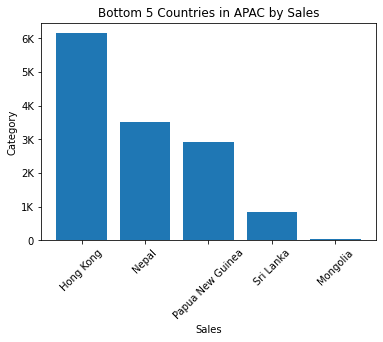

In [48]:
plot_bar(
    types = 'bar',
    index = sales_bot_5.index,
    values = sales_bot_5['Sales'],
    title = "Bottom 5 Countries in APAC by Sales",
        tick = (0,1000,2000,3000,4000,5000,6000),
        label = ('0','1K','2K','3K','4K','5K','6K'),
        labelx = 'Sales',
        labely = "Category")

Mongolia, Sri Lanka, Papua New Guinea, Nepal and Hong Kong are the worst performing countries in terms of sales.

In [49]:
pro_bot_5 = apac_df.groupby('Country')['Profit'].sum().sort_values(ascending=False).tail().to_frame()
pro_bot_5

,Profit
Country,
Myanmar (Burma),-2109.26
Thailand,-7308.19
South Korea,-12792.83
Philippines,-16128.23
Pakistan,-22446.65


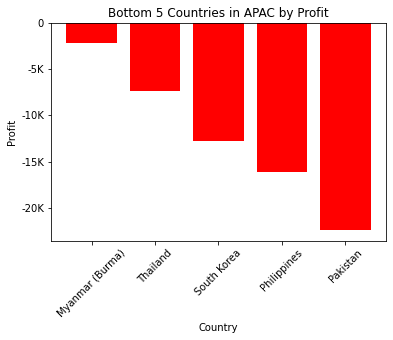

In [50]:
plt.bar(pro_bot_5.index,pro_bot_5['Profit'],color='r')
plt.title("Bottom 5 Countries in APAC by Profit")
plt.yticks(ticks = (0,-5000,-10000,-15000,-20000),
           labels = ('0','-5K','-10K','-15K','-20K'))
plt.xticks(rotation=45)
plt.xlabel("Country")
plt.ylabel("Profit")
plt.show()

After analyzing the sales and profit by country, segment and category, we want to look at the impact discount has on sales and profit in the APAC region. We will use a sample of 300 orders for this test but we will first remove outliers before taking the sample. This is to ensure that the results are not influenced by outliers.

##### Statistical test
Given that we have two set of numeric values, Sales and Discount, that are both absolute zero measures and we want to assess the relationship between the scores, the appropriate statistical test to use is the Pearson r correlation coefficient.

##### Hypotheses

Null Hypothesis: There is no positive relationship between Discount and Sales in the APAC market

Alternative Hypothesis: There is a positive relationship between Discount and Sales in the APAC market

##### Decision Rules
Given:
* 0.05 level of significance
* a one-tailed Pearson r test

df = n-2 
   
   = 300 - 2
   
   = 298
   
The critical values for r in the r tables is +/- 0.095.

Therefore:

if r-obs < 0.095, retain the null hypotheses, and

if r-obs >= 0.095. reject the null hypotheses


##### Computation

We will calculate for outliers and remove them. 

We will use a function that calculates for the outlier boundaries and drops rows that fall within these boundaries.

In [51]:
def outlier_dropper(dataframe):
    '''Drops outliers in sales and discount columns
    
    Input
    dataframe: pandas dataframe
    
    Output
    return: dataframe with outliers removed'''
    sales_q1 = dataframe['Sales'].describe()[4]
    sales_q3 = dataframe['Sales'].describe()[6]
    sales_iqr = sales_q3 - sales_q1
    sales_high = sales_q3 + (sales_iqr * 1.5)
    sales_low = sales_q1 - (sales_iqr * 1.5)
    disc_q1 = dataframe['Discount'].describe()[4]
    disc_q3 = dataframe['Discount'].describe()[6]
    disc_iqr = disc_q3 - disc_q1
    disc_high = disc_q3 + (disc_iqr * 1.5)
    disc_low = disc_q1 - (disc_iqr * 1.5)
    df_no_outliers = dataframe.drop(dataframe[
                              (dataframe.Sales >= sales_high) | 
                               (dataframe.Sales <= sales_low) |
                              (dataframe.Discount >= disc_high) |
                              (dataframe.Discount <= disc_low)].index)
    return df_no_outliers


After defining the function, we will call the function on the APAC dataframe to remove all outliers in the sales and discount columns.

In [52]:
# assigning dataframe without outliers to new variable
apac_no_outliers = outlier_dropper(apac_df)

To calculate for the r observation, we will use a while loop to take the sample 3 times and calculate the r observation for that sample. We will compare the r observation of these 3 samples to the decision rules.

In [53]:
def sample_corrcoef(dataframe,n):
    i = 1
    while i < 4:
        # taking sample
        sample = dataframe.sample(300)
        # assigning discount to x
        x = sample['Discount']
        # assigning sales to y
        y = sample['Sales']
        # computing correlation coefficient
        corr = np.corrcoef(x,y)
        # displaying correlation coefficient
        print(corr)
        i +=1

In [54]:
sample_corrcoef(apac_no_outliers,300)

[[ 1.         -0.07984077]
 [-0.07984077  1.        ]]
[[ 1.         -0.08150702]
 [-0.08150702  1.        ]]
[[ 1.         -0.05143383]
 [-0.05143383  1.        ]]


The correlation coefficients from the calculation are -0.14,-0.12 and -0.20.

To make a decision, we will compare the r observation to the decision rules.

##### Decision

Since for each sample, the r-obs is less than 0.095, we retain the null hypotheses.

##### Interpretation

Therefore we conclude that, discount does not have a positive relationship with sales in the APAC market.

### EU Market Analysis

We will extract the orders in the EU market into a separate dataframe.

In [55]:
eu_df = df.query('Market == "EU"')
eu_df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
3,11731,IT-2011-3647632,2011-01-01,5/1/2011,Second Class,EM-14140,Eugene Moren,Home Office,Stockholm,Stockholm,...,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",44.87,3,0.50,-26.05,4.82,High
13,16727,ES-2011-5268439,2011-01-02,3/2/2011,Second Class,GH-14485,Gene Hale,Corporate,La Rochelle,Poitou-Charentes,...,OFF-AR-10001529,Office Supplies,Art,"Binney & Smith Pencil Sharpener, Easy-Erase",139.65,5,0.00,15.30,19.23,High
16,19796,ES-2011-5460465,2011-01-02,5/2/2011,Standard Class,RR-19315,Ralph Ritter,Consumer,Parma,Emilia-Romagna,...,OFF-AR-10000980,Office Supplies,Art,"Sanford Pencil Sharpener, Water Color",78.30,3,0.00,20.34,6.03,Medium
19,16726,ES-2011-5268439,2011-01-02,3/2/2011,Second Class,GH-14485,Gene Hale,Corporate,La Rochelle,Poitou-Charentes,...,OFF-EN-10004597,Office Supplies,Envelopes,"GlobeWeis Peel and Seal, Set of 50",21.39,1,0.00,0.00,3.34,High
20,14413,ES-2011-2205486,2011-01-02,7/2/2011,Standard Class,IM-15055,Ionia McGrath,Consumer,Halle,North Rhine-Westphalia,...,OFF-BI-10001249,Office Supplies,Binders,"Acco Hole Reinforcements, Recycled",21.06,3,0.00,10.53,1.86,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51246,12928,ES-2014-3458802,2014-12-31,5/1/2015,Standard Class,JG-15805,John Grady,Corporate,Maidenhead,England,...,FUR-BO-10004080,Furniture,Bookcases,"Ikea Stackable Bookrack, Traditional",245.16,2,0.00,90.66,19.21,Medium
51248,10625,ES-2014-2815584,2014-12-31,4/1/2015,Standard Class,ES-14020,Erica Smith,Consumer,Bielefeld,North Rhine-Westphalia,...,OFF-SU-10004279,Office Supplies,Supplies,"Kleencut Shears, Serrated",260.82,6,0.00,12.96,15.79,High
51267,16561,IT-2014-3715679,2014-12-31,5/1/2015,Second Class,JK-15640,Jim Kriz,Home Office,Eindhoven,North Brabant,...,OFF-AR-10000659,Office Supplies,Art,"BIC Pencil Sharpener, Fluorescent",30.27,2,0.50,-9.69,4.46,High
51272,16563,IT-2014-3715679,2014-12-31,5/1/2015,Second Class,JK-15640,Jim Kriz,Home Office,Eindhoven,North Brabant,...,OFF-BI-10002986,Office Supplies,Binders,"Avery Binder Covers, Recycled",22.86,4,0.50,-6.42,3.46,High


In [56]:
# Total sales in EU market
eu_sales = eu_df['Sales'].sum()
print('Total sales in EU: {:.2f}'.format(eu_sales))

Total sales in EU: 2938089.06


In [57]:
# Total profit in EU market
eu_pro = eu_df['Profit'].sum()
print('Total profit in EU: {:.2f}'.format(eu_pro))

Total profit in EU: 372829.74


We will now breakdown the EU market into countries to assess the impact the countries are having on sales and profit in the EU market.

We start by checking the number of orders per country.

In [58]:
# Number of EU orders per country
eu_country_orders = eu_df['Country'].value_counts()
eu_country_orders

France            2827
Germany           2065
United Kingdom    1633
Italy             1108
Spain              859
Netherlands        435
Austria            270
Sweden             203
Belgium            147
Ireland            106
Switzerland         78
Norway              70
Portugal            70
Denmark             65
Finland             64
Name: Country, dtype: int64

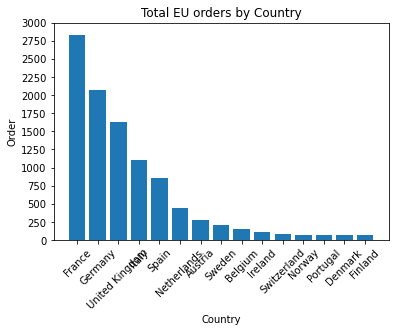

In [59]:
plot_bar("bar", eu_country_orders.index, eu_country_orders, "Total EU orders by Country", 
         (0, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000),
         ("0", "250", "500", "750", "1000", "1250", "1500", "1750", "2000", "2250", "2500", "2750", "3000"), "Country", "Order")

In the EU market, France is the country with the most orders while Finland is the country with the least orders. We will proceed to investigate the top 5 countries and bottom 5 countries in terms of sales and profit.

##### Top 5 countries by sales and profit

In [60]:
# Top 5 countries by sales
eu_top5sales = eu_df.groupby('Country')['Sales'].sum().nlargest(5).sort_values(ascending=True).to_frame()
eu_top5sales

,Sales
Country,
Spain,287146.68
Italy,289709.66
United Kingdom,528576.30
Germany,628840.03
France,858931.08


In [61]:
# Top 5 countries by profit
eu_top5pro = eu_df.groupby('Country')['Profit'].sum().nlargest(5).sort_values(ascending=True).to_frame()
eu_top5pro

,Profit
Country,
Austria,21442.26
Spain,54390.12
Germany,107322.82
France,109029.00
United Kingdom,111900.15


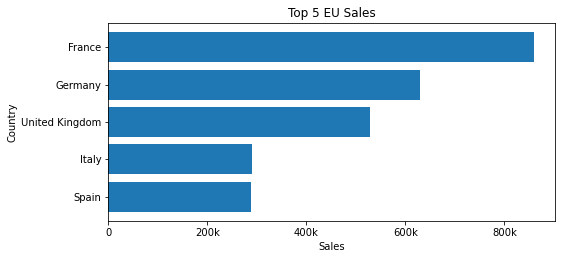

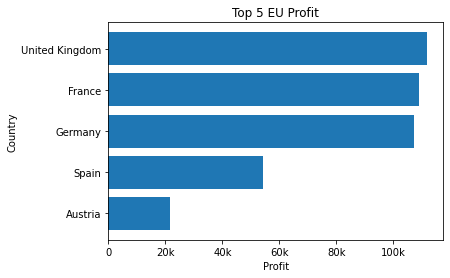

In [62]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plot_bar('barh', eu_top5sales.index, eu_top5sales['Sales'], 'Top 5 EU Sales', 
         (0,200000,400000,600000,800000), ('0', '200k', '400k', '600k', '800k'), 'Sales', 'Country')

plot_bar('barh', eu_top5pro.index, eu_top5pro['Profit'], 'Top 5 EU Profit', 
         (0,20000,40000,60000,80000, 100000), ('0', '20k', '40k', '60k', '80k', '100k'), 'Profit', 'Country')

France, Germany, United Kingdom and Italy are the best performing countries in both sales and profit in the EU Market. 

##### Top Segment by sales and profit

In [63]:
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
seg_topsales = eu_df.groupby('Segment')['Sales'].sum().nlargest(5).sort_values(ascending=False).to_frame()
seg_topsales

,Sales
Segment,
Consumer,1529716.24
Corporate,920008.28
Home Office,488364.54


In [64]:
seg_toppro = eu_df.groupby('Segment')['Profit'].sum().nlargest(5).sort_values(ascending=False).to_frame()
seg_toppro

,Profit
Segment,
Consumer,188687.71
Corporate,123393.98
Home Office,60748.05


In [65]:
plt.figure(figsize=(8,8),dpi=1600)
plt.subplot(1,2,1)
plt.pie(seg_topsales['Sales'] ,
        autopct='%.1f%%',
        labels=seg_topsales.index)
plt.title("Sales of Segment in the Eu Market")


plt.subplot(1,2,2)
plt.pie(seg_toppro['Profit'],
        autopct='%.1f%%',
        labels=seg_toppro.index)
plt.title("Profit of Segment in the EU Market")
plt.show()

In terms of profit and sales, Consumer is the best performing Segment in the EU market. This is followed by the Corporate segment then the Home Office Segment.

We will now look at the categories in terms of sales and profit.

##### Top Category by sales and profit

In [66]:
# Category by Sales
cat_topsales = eu_df.groupby('Category')['Sales'].sum().nlargest(5).sort_values(ascending=False)
cat_topsales.to_frame()


,Sales
Category,
Technology,1112678.99
Office Supplies,1046307.02
Furniture,779103.05


In [67]:
# Category by profit
cat_toppro = eu_df.groupby('Category')['Profit'].sum().nlargest(5).sort_values(ascending=False)
cat_toppro.to_frame()

,Profit
Category,
Office Supplies,159706.94
Technology,144272.66
Furniture,68850.14


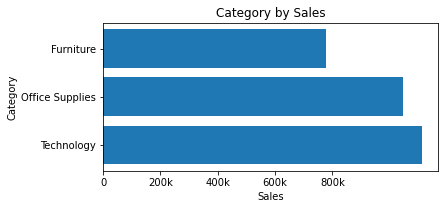

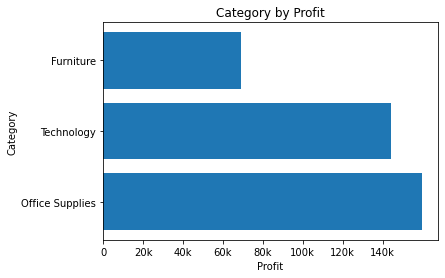

In [68]:
plt.figure(figsize=(6,6))
plt.subplot(2,1,1)
plot_bar('barh', cat_topsales.index, cat_topsales, 'Category by Sales', 
         (0,200000,400000,600000,800000), ('0', '200k', '400k', '600k', '800k'), 'Sales', 'Category')

plot_bar('barh', cat_toppro.index, cat_toppro, 'Category by Profit', 
         (0,20000,40000,60000,80000, 100000, 120000, 140000), 
         ('0', '20k', '40k', '60k', '80k', '100k', '120k', '140k'), 'Profit', 'Category')

Sales
Technology is the best performing category by sales with `$1,112,687.99` in sales in the EU market. It is closely followed by Office Supplies which accounted for `$1,046,307.02` in sales and Furniture accounted for `$779,103.05` in sales.

Profit
Office Supplies brouhgt in the most profit with `$159,706.94`. Technology followed with a profit of `$144,272.66` and lastly Furniture accounted for `$68,850.14` in profit.

We will now look at the 5 worst performing countries in the EU market in terms of sales and profit.

##### Bottom 5 countries in EU by sales and profit

In [69]:
# Bottom 5 countries by sales
eu_bot5sales = eu_df.groupby('Country')['Sales'].sum().sort_values(ascending=False).tail(5).to_frame()
eu_bot5sales

,Sales
Country,
Finland,20704.35
Norway,20525.37
Ireland,16639.51
Portugal,15105.12
Denmark,8638.05


In [70]:
# Bottom 5 countries by profit
eu_bot5pro = eu_df.groupby('Country')['Profit'].sum().sort_values(ascending=False).tail(5).to_frame()
eu_bot5pro

,Profit
Country,
Denmark,-4282.05
Ireland,-7392.38
Portugal,-8703.06
Sweden,-17519.37
Netherlands,-41070.07


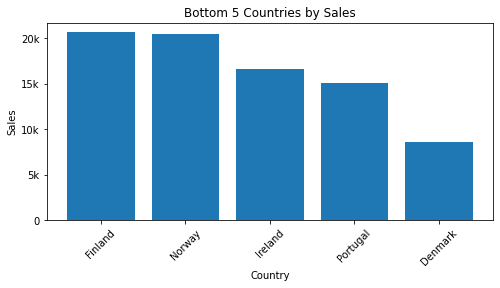

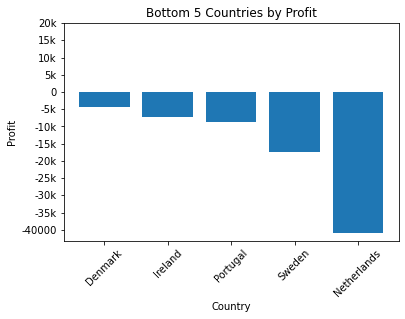

In [71]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plot_bar('bar', eu_bot5sales.index, eu_bot5sales['Sales'], 'Bottom 5 Countries by Sales', 
         (0,5000,10000,15000,20000), ('0', '5k', '10k', '15k', '20k'), 'Country', 'Sales') 

plot_bar('bar', eu_bot5pro.index, eu_bot5pro['Profit'], 'Bottom 5 Countries by Profit', 
         (0,5000, 10000, 15000, 20000, -5000,-10000,-15000,-20000, -25000, -30000, -35000, -40000), 
         ('0', '5k', '10k', '15k', '20k', '-5k', '-10k', '-15k', '-20k', '-25k', '-30k', '-35k',
          '-40000'), 'Country', 'Profit')

1. From the first plot above, Denmark had the least sales in the EU region with Portugal,Ireland, Norway, and Finland following in ascending order of their least contribution to sales in the EU region.

2. The plot second plot, however captured the profits these countries had. There were losses incurred and Netherlands had the highest loss followed by Sweden, Portugal, Ireland and Denmark in descending order.

NB: It is worth mentioning that, even though Finland and Norway were in the bottom 5 list, there did not incur losses.

After analyzing the sales and profit by country, segment and category, we want to look at the impact discount has on sales and profit in the EU market. We will use a sample of 300 orders for this test but we will first remove outliers before taking the sample. This is to ensure that the results are not influenced by outliers.

##### Statistical test
Given that we have two set of numeric values, Sales and Discount, that are both absolute zero measures and we want to assess the relationship between the scores, the appropriate statistical test to use is the Pearson r correlation coefficient.

##### Hypotheses

Null Hypothesis: There is no positive relationship between Discount and Sales in the EU market

Alternative Hypothesis: There is a positive relationship between Discount and Sales in the EU market

##### Decision Rules
Given:
* 0.05 level of significance
* a one-tailed Pearson r test

df = n-2 
   
   = 300 - 2
   
   = 298
   
The critical values for r in the r tables is +/- 0.095.

Therefore:

if r-obs < 0.095, retain the null hypotheses, and

if r-obs >= 0.095. reject the null hypotheses


##### Computation

We will calculate for outliers and remove them. We first check for outliers in the sales column

In [72]:
def outlier_dropper(dataframe):
    sales_q1 = dataframe['Sales'].describe()[4]
    sales_q3 = dataframe['Sales'].describe()[6]
    sales_iqr = sales_q3 - sales_q1
    sales_high = sales_q3 + (sales_iqr * 1.5)
    sales_low = sales_q1 - (sales_iqr * 1.5)
    disc_q1 = dataframe['Discount'].describe()[4]
    disc_q3 = dataframe['Discount'].describe()[6]
    disc_iqr = disc_q3 - disc_q1
    disc_high = disc_q3 + (disc_iqr * 1.5)
    disc_low = disc_q1 - (disc_iqr * 1.5)
    df_no_outliers = dataframe.drop(dataframe[
                              (dataframe.Sales >= sales_high) | 
                               (dataframe.Sales <= sales_low) |
                              (dataframe.Discount >= disc_high) |
                              (dataframe.Discount <= disc_low)].index)
    return df_no_outliers


In [73]:
eu_no_outliers = outlier_dropper(eu_df)
eu_no_outliers

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
13,16727,ES-2011-5268439,2011-01-02,3/2/2011,Second Class,GH-14485,Gene Hale,Corporate,La Rochelle,Poitou-Charentes,...,OFF-AR-10001529,Office Supplies,Art,"Binney & Smith Pencil Sharpener, Easy-Erase",139.65,5,0.00,15.30,19.23,High
16,19796,ES-2011-5460465,2011-01-02,5/2/2011,Standard Class,RR-19315,Ralph Ritter,Consumer,Parma,Emilia-Romagna,...,OFF-AR-10000980,Office Supplies,Art,"Sanford Pencil Sharpener, Water Color",78.30,3,0.00,20.34,6.03,Medium
19,16726,ES-2011-5268439,2011-01-02,3/2/2011,Second Class,GH-14485,Gene Hale,Corporate,La Rochelle,Poitou-Charentes,...,OFF-EN-10004597,Office Supplies,Envelopes,"GlobeWeis Peel and Seal, Set of 50",21.39,1,0.00,0.00,3.34,High
20,14413,ES-2011-2205486,2011-01-02,7/2/2011,Standard Class,IM-15055,Ionia McGrath,Consumer,Halle,North Rhine-Westphalia,...,OFF-BI-10001249,Office Supplies,Binders,"Acco Hole Reinforcements, Recycled",21.06,3,0.00,10.53,1.86,Medium
21,14414,ES-2011-2205486,2011-01-02,7/2/2011,Standard Class,IM-15055,Ionia McGrath,Consumer,Halle,North Rhine-Westphalia,...,OFF-BI-10001717,Office Supplies,Binders,"Avery Hole Reinforcements, Durable",11.82,2,0.00,4.20,0.93,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51236,15297,ES-2014-5281275,2014-12-31,4/1/2015,Second Class,SS-20515,Shirley Schmidt,Home Office,Madrid,Madrid,...,TEC-CO-10002284,Technology,Copiers,"Hewlett Copy Machine, Color",530.22,2,0.00,180.24,48.00,Medium
51241,16469,ES-2014-3638865,2014-12-31,1/1/2015,First Class,SV-20935,Susan Vittorini,Consumer,Worcester,England,...,OFF-ST-10002539,Office Supplies,Storage,"Fellowes Shelving, Single Width",289.35,5,0.00,75.15,34.47,Critical
51246,12928,ES-2014-3458802,2014-12-31,5/1/2015,Standard Class,JG-15805,John Grady,Corporate,Maidenhead,England,...,FUR-BO-10004080,Furniture,Bookcases,"Ikea Stackable Bookrack, Traditional",245.16,2,0.00,90.66,19.21,Medium
51248,10625,ES-2014-2815584,2014-12-31,4/1/2015,Standard Class,ES-14020,Erica Smith,Consumer,Bielefeld,North Rhine-Westphalia,...,OFF-SU-10004279,Office Supplies,Supplies,"Kleencut Shears, Serrated",260.82,6,0.00,12.96,15.79,High


The new dataframe does not have outliers in the sales and discount columns. Now we will take a random sample of the data and calculate for the r coefficient. We will use a while loop to run the sampling and calculation 3 times.

In [74]:
i = 1
while i < 4:
    # taking sample
    sample = eu_no_outliers.sample(300)
    # assigning discount to x
    x = sample['Discount']
    # assigning sales to y
    y = sample['Sales']
    # computing correlation coefficient
    corr = np.corrcoef(x,y)
    # displaying correlation coefficient
    print(corr)
    i += 1

[[1.         0.33924913]
 [0.33924913 1.        ]]
[[1.         0.38130203]
 [0.38130203 1.        ]]
[[1.         0.45508415]
 [0.45508415 1.        ]]


The correlation coefficients are 0.21,0.19 and 0.28.

We will compare these values to the decision rules.

##### Descision

Since for each sample, the r-obs is greater than 0.095, we reject the null hypotheses.

##### Interpretation

Therefore we conclude that, discount has a positive relationship with sales in the EU market. However the relationship is a weak one. Thus, an increase in Discount in the EU market would increase sales by a little margin.

## US Market Analysis

We will first copy the orders in the US market into a sepearate dataframe.

In [75]:
us_df = df.query("Market == 'US'")
us_df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
7,34662,CA-2011-115161,2011-01-02,3/2/2011,First Class,LC-17050,Liz Carlisle,Consumer,Mission Viejo,California,...,FUR-BO-10003966,Furniture,Bookcases,"Sauder Facets Collection Library, Sky Alder Fi...",290.67,2,0.15,3.42,54.64,High
27,37844,CA-2011-113880,2011-01-03,5/3/2011,Standard Class,VF-21715,Vicky Freymann,Home Office,Elmhurst,Illinois,...,FUR-CH-10000863,Furniture,Chairs,Novimex Swivel Fabric Task Chair,634.12,6,0.30,-172.12,70.05,High
32,31454,CA-2011-104269,2011-01-03,6/3/2011,Second Class,DB-13060,Dave Brooks,Consumer,Seattle,Washington,...,FUR-CH-10004063,Furniture,Chairs,Global Deluxe High-Back Manager's Chair,457.57,2,0.20,51.48,47.89,Medium
34,39607,CA-2011-168312,2011-01-03,7/3/2011,Standard Class,GW-14605,Giulietta Weimer,Consumer,Houston,Texas,...,FUR-TA-10001866,Furniture,Tables,Bevis Round Conference Room Tables and Bases,376.51,3,0.30,-43.03,32.70,Medium
36,39245,CA-2011-131009,2011-01-03,5/3/2011,Standard Class,SC-20380,Shahid Collister,Consumer,El Paso,Texas,...,FUR-CH-10001270,Furniture,Chairs,Harbour Creations Steel Folding Chair,362.25,6,0.30,0.00,25.22,Medium


After copying the data for US market, we will check the total sales, profit, and discount in the US market.

In [76]:
us_sales = us_df['Sales'].sum()
us_pro = us_df['Profit'].sum()
us_dis = us_df['Discount'].sum()
print('Total sales in US: {:.2f}'.format(us_sales))
print('Total profit in US: {:.2f}'.format(us_pro))
print('Total discount in US: {:.2f}'.format(us_dis))

Total sales in US: 2297200.86
Total profit in US: 286397.02
Total discount in US: 1561.09


Even though US is market, it is a country as well. Therefore the analysis will focus on the states in US.

We will check the value counts of states in the US.

In [77]:
us_df['State'].value_counts().to_frame()

,State
California,2001
New York,1128
Texas,985
Pennsylvania,587
Washington,506
Illinois,492
Ohio,469
Florida,383
Michigan,255
North Carolina,249


Given the large number of states, we will plot the top 10 and bottom 10 by orders.

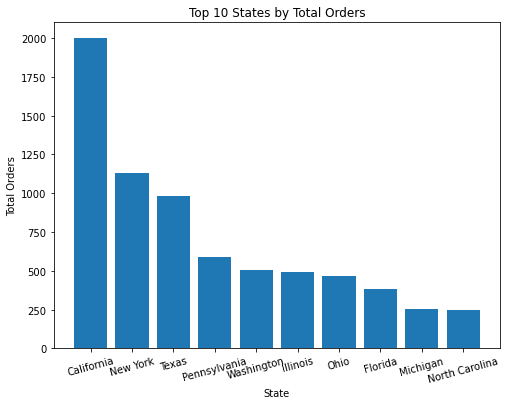

In [78]:
top_10  = us_df['State'].value_counts().head(10)
plt.figure(figsize=(8,6))
plt.bar(top_10.index,top_10)
plt.xticks(rotation=15)
plt.title("Top 10 States by Total Orders")
plt.xlabel("State")
plt.ylabel("Total Orders")
plt.show()

California, New York, Texas, Pensylvania, Washington, Illinois, Ohio, Florida, Michigan and North Carolina are the states with the highest orders in the US market. Now we will look at the bottom 10.

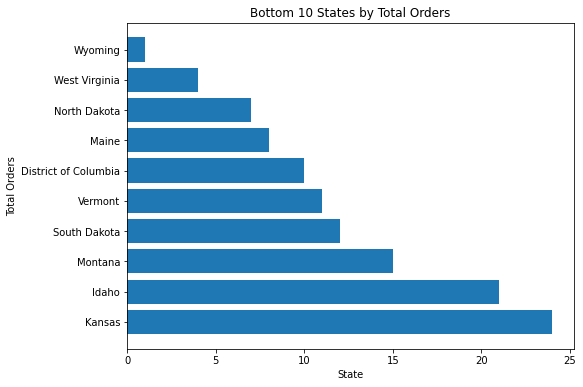

In [79]:
bot_10  = us_df['State'].value_counts().tail(10)
plt.figure(figsize=(8,6))
plt.barh(bot_10.index,bot_10)
plt.title("Bottom 10 States by Total Orders")
plt.xlabel("State")
plt.ylabel("Total Orders")
plt.show()

Wyoming, West Virginia, North Dakota, Maine, District of Columbia, Vermont, South Dakota, Montana, Idaho, and Kansas are the states with the least orders in the US market.

Now we will analyze the states in terms of sales and profit.

#### Top 10 States by Sales

In [80]:
sales_top_10 = us_df.groupby('State')['Sales'].sum().nlargest(10)
us_top_10_sls = sales_top_10.sort_values(ascending=True).to_frame()
us_top_10_sls

,Sales
State,
Virginia,70636.72
Michigan,76269.61
Ohio,78258.14
Illinois,80166.10
Florida,89473.71
Pennsylvania,116511.91
Washington,138641.27
Texas,170188.05
New York,310876.27


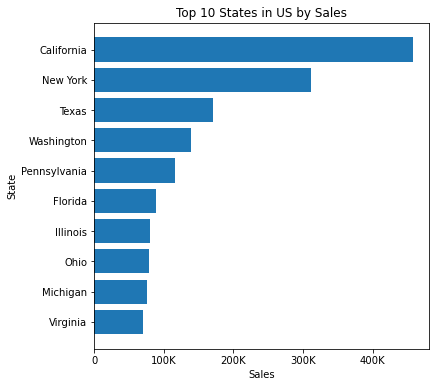

In [81]:
plt.figure(figsize= (6,6))
plot_bar(types = 'barh',
        index = us_top_10_sls.index,
        values = us_top_10_sls['Sales'],
        title = "Top 10 States in US by Sales",
        tick = (0,100000,200000,300000,400000),
        label = ('0','100K','200K','300K','400K'),
        labelx = "Sales",
        labely = "State")

The top 10 states in the US market by sales are; California, New York, Texas, Washington, Pensylvannia, Florida, Illinois, Ohio, Michigan and Virginia.

We will now analyze the states by Profit.

### Top 10 States by Profit

In [82]:
profit_top_10 = us_df.groupby('State')['Profit'].sum().nlargest(10)
us_top_10_pro = profit_top_10.sort_values(ascending=True).to_frame()
us_top_10_pro

,Profit
State,
Delaware,9977.37
Minnesota,10823.19
Kentucky,11199.70
Georgia,16250.04
Indiana,18382.94
Virginia,18597.95
Michigan,24463.19
Washington,33402.65
New York,74038.55


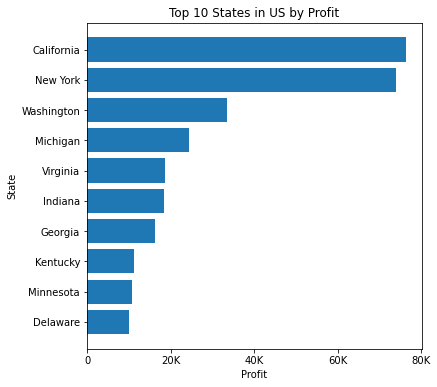

In [83]:
plt.figure(figsize=(6,6))
plot_bar(types = 'barh',
        index = us_top_10_pro.index,
        values = us_top_10_pro['Profit'],
        title = "Top 10 States in US by Profit",
        tick = (0,20000,40000,60000,80000),
        label = ('0','20K','40K','60K','80K'),
        labelx = "Profit",
        labely = "State")

The top 10 states in the US market in terms of profit are; California, New York, Washington, Michigan, Virginia, Indiana, Georgia, Kentucky, Minnesota and Delaware.

Out of the top 10 states by sales, only California, New York, Washington, Michigan and Virginia are in the top 10 states by profit. This means that the profit margin is high in these states.

Also, out of the top 10 states by profit, Indiana, Georgia, Kentucky, Minnesota and Delaware were not in the top 10 states by sales. This indicates a high profit margin in these states.

We will now check the best performing Segments in the US market.

In [84]:
us_segs_sales = us_df.groupby('Segment')[['Sales']].sum()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
us_segs_sales

,Sales
Segment,
Consumer,1161401.34
Corporate,706146.37
Home Office,429653.15


In [85]:
us_segs_pro = us_df.groupby('Segment')[['Profit']].sum()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
us_segs_pro

,Profit
Segment,
Consumer,134119.21
Corporate,91979.13
Home Office,60298.68


In [86]:
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(us_segs_sales['Sales'],
        autopct='%.1f%%',
        labels=us_segs_sales.index)
plt.title("Sales of Segment in the US Market")


plt.subplot(1,2,2)
plt.pie(us_segs_pro['Profit'],
        autopct='%.1f%%',
        labels=us_segs_pro.index)
plt.title("Profit of Segment in the US Market")
plt.show()

In the US market, the Consumer segment is responsible for the most sales and Profit as well. This is followed by the Corporate segment. The Home Office segment is the least contributor to sales and profit in the US market.

Now we will check the product categories.

In [87]:
us_cat_sales = us_df.groupby('Category')['Sales'].sum().sort_values().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
us_cat_sales

,Sales
Category,
Office Supplies,719047.03
Furniture,741999.80
Technology,836154.03


In [88]:
us_cat_profit = us_df.groupby('Category')['Profit'].sum().sort_values().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
us_cat_profit

,Profit
Category,
Furniture,18451.27
Office Supplies,122490.80
Technology,145454.95


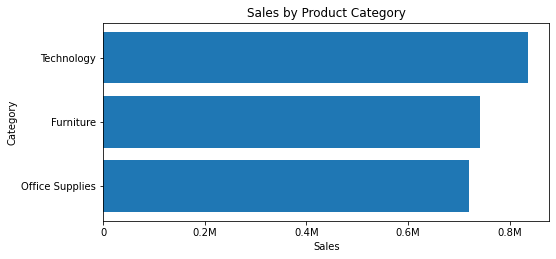

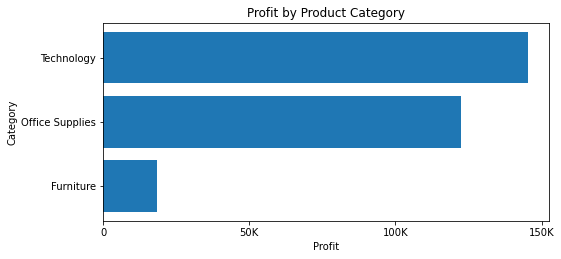

In [89]:
plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = us_cat_sales.index,
    values = us_cat_sales['Sales'],
    title = "Sales by Product Category",
        tick = (0,200000,400000,600000,800000),
        label = ('0','0.2M','0.4M','0.6M','0.8M'),
        labelx = 'Sales',
        labely = "Category"
)


plt.figure(figsize=(8,8))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = us_cat_profit.index,
    values = us_cat_profit['Profit'],
    title = "Profit by Product Category",
        tick = (0,50000,100000,150000),
        label = ('0','50K','100K','150K'),
        labelx = 'Profit',
        labely = "Category"
)

In the US market, Technology is the highest contributor to sales and profit. Even though Furniture makes more sales than Office Supplies, Office Supplies makes more profit than Furniture. This indicates that Office Supplies has a higher profit margin than Furniture in the US market.

Now we will investigate the relationship between sales and discount in the US market.

After analyzing the sales and profit by country, segment and category, we want to look at the impact discount has on sales and profit in the US market. We will use a sample of 300 orders for this test but we will first remove outliers before taking the sample. This is to ensure that the results are not influenced by outliers.

#### Statistical test
Given that we have two set of numeric values, Sales and Discount, that are both absolute zero measures and we want to assess the relationship between the scores, the appropriate statistical test to use is the Pearson r correlation coefficient.

#### Hypotheses
Null Hypothesis: There is no positive relationship between Discount and Sales in the US market

Alternative Hypothesis: There is a positive relationship between Discount and Sales in the US market

#### Decision Rules
Given:

0.05 level of significance
a one-tailed Pearson r test
df = n-2

= 300 - 2

= 298

The critical values for r in the r tables is +/- 0.095.

Therefore:

if r-obs < 0.095, retain the null hypotheses, and

if r-obs >= 0.095. reject the null hypotheses

#### Computation

In [90]:
# dropping outliers
us_no_outliers = outlier_dropper(us_df)

In [91]:
sample_corrcoef(us_no_outliers,300)

[[1.         0.01239115]
 [0.01239115 1.        ]]
[[1.         0.23317864]
 [0.23317864 1.        ]]
[[1.         0.17943553]
 [0.17943553 1.        ]]


The correlation coefficients are 0.15,0.14 and 0.17.

We will compare these values to the decision rules.

##### Descision

Since for each sample, the r-obs is greater than 0.095, we reject the null hypotheses.

##### Interpretation

Therefore we conclude that, discount has a positive relationship with sales in the US market. However the relationship is a weak one. Thus, an increase in Discount in the US market would increase sales by a little margin.

# EMEA Market Analysis 

Extraction of  orders in EMEA market into a separate dataframe.

In [92]:
emea_df = df.query('Market == "EMEA"')

In [93]:
emea_sls = emea_df['Sales'].sum()
print(f'Total Sales in EMEA Market: {emea_sls}')

Total Sales in EMEA Market: 806161.311


In [94]:
emea_pro = emea_df['Profit'].sum()
print(f'Total Profit in EMEA market: {emea_pro}')

Total Profit in EMEA market: 43897.971000000005


We will perform our analysis on the countries in or states in EMEA market 
We start by checking the number of orders by state.


In [95]:
emea_df["State"].value_counts()

Istanbul             425
Baghdad              173
Ankara               161
Ar Riyad             151
Izmir                123
                    ... 
Kastamonu              1
Osjecko-Baranjska      1
Ardahan                1
Shumen                 1
Semnan                 1
Name: State, Length: 289, dtype: int64

In [96]:
sales_top_5 = emea_df.groupby('Country')['Sales'].sum().nlargest(5)
emea_top_5 = sales_top_5.sort_values(ascending=False).to_frame()
emea_top_5

,Sales
Country,
Iran,113746.11
Turkey,108507.95
Ukraine,86857.17
Russia,82913.88
Saudi Arabia,82012.20


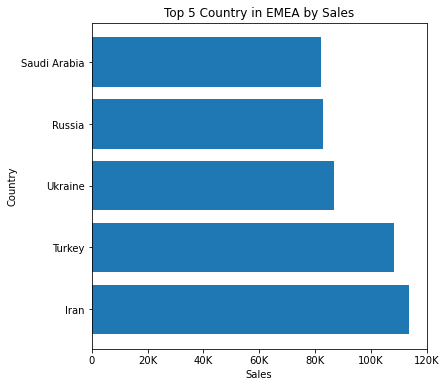

In [97]:
plt.figure(figsize=(6,6))
plot_bar(types = 'barh',
        index = emea_top_5.index,
        values = emea_top_5['Sales'],
        title = "Top 5 Country in EMEA by Sales",
        tick = (0,20000,40000,60000,80000, 100000, 120000),
        label = ('0','20K','40K','60K','80K','100K','120K'),
        labelx = "Sales",
        labely = "Country")

In [98]:
profit_top_5 = emea_df.groupby('Country')['Profit'].sum().nlargest(5)
emea_profit_5 = profit_top_5.sort_values(ascending=False).to_frame()
emea_profit_5

,Profit
Country,
Iran,26856.24
Russia,22536.45
Ukraine,20944.23
Saudi Arabia,19339.59
Iraq,18243.21


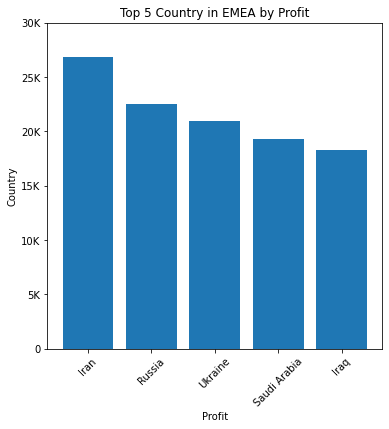

In [99]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = emea_profit_5.index,
        values = emea_profit_5['Profit'],
        title = "Top 5 Country in EMEA by Profit",
        tick = (0,5000,10000,15000,20000, 25000, 30000),
        label = ('0','5K','10K','15K','20K','25K','30K'),
        labelx = "Profit",
        labely = "Country")

#### Bottom 5 countries by sales and profit

In [100]:
emea_sales_bot5 = emea_df.groupby('Country')['Sales'].sum().sort_values(ascending=False).tail().to_frame()
emea_sales_bot5

,Sales
Country,
United Arab Emirates,744.12
Bahrain,669.18
Tajikistan,242.78
Macedonia,209.64
Armenia,156.75


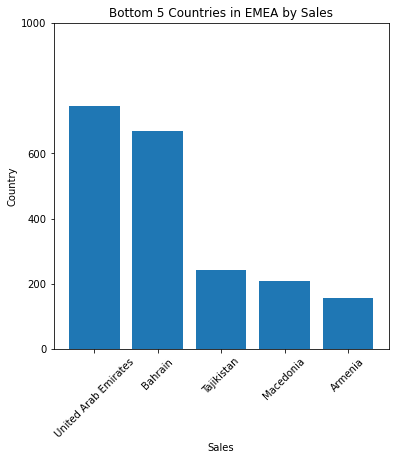

In [101]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = emea_sales_bot5.index,
        values = emea_sales_bot5['Sales'],
        title = "Bottom 5 Countries in EMEA by Sales",
        tick = (0,200,400,600,1000),
        label = ('0','200','400','600','1000'),
        labelx = "Sales",
        labely = "Country")

In [102]:
emeapro_bot5 = emea_df.groupby('Country')['Profit'].sum().sort_values(ascending=False).tail().to_frame()
emeapro_bot5

,Profit
Country,
Turkmenistan,-3302.71
Yemen,-3706.46
Kazakhstan,-7099.90
Lithuania,-8966.12
Turkey,-98447.23


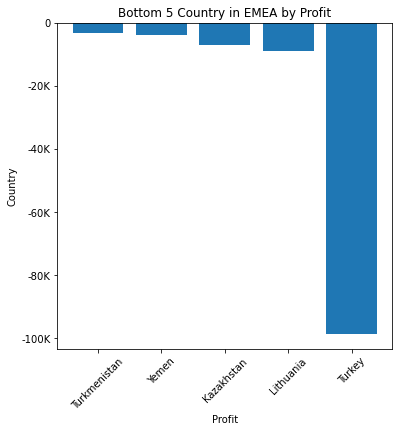

In [103]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = emeapro_bot5.index,
        values = emeapro_bot5['Profit'],
        title = "Bottom 5 Country in EMEA by Profit",
        tick = (-20000,-40000,-60000, -80000, -100000,0),
        label = ('-20K','-40K','-60K','-80K','-100K','0'),
        labelx = "Profit",
        labely = "Country")

From our analysis on sales in the EMEA Market, it shows that Iran, a country in this market is leading in both Sales and Profit, and Turkey recorded heavy losses, however it was the second highest country leading in Sales in the EMEA Market. 

#### Analysis in the EMEA Market on Sales and Protit according to Segments and Categories.

In [104]:
emea_segs_sales = emea_df.groupby('Segment')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
emea_segs_sales

,Sales
Segment,
Consumer,406745.18
Corporate,250571.39
Home Office,148844.73


In [105]:
emea_segs_profit = emea_df.groupby('Segment')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
emea_segs_profit

,Profit
Segment,
Consumer,25532.57
Corporate,12499.13
Home Office,5866.26


#### Pie Charts Showing the Sales and Profit Made in the Segments of EMEA Market.

In [106]:
#Plotting a pie chart 
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(emea_segs_sales['Sales'],
        autopct='%.1f%%',
        labels=emea_segs_sales.index)
plt.title("Sales of Segments in the EMEA Market")
plt.legend(emea_segs_sales.index)


plt.subplot(1,2,2)
plt.pie(emea_segs_profit['Profit'],
        autopct='%.1f%%',
        labels=emea_segs_profit.index)
plt.title("Profit of Segments in the EMEA Market")
plt.show()

In terms of profit and sales in the EMEA Market, Consumer is the best performing Segment. This is followed by the Corporate segment then the Home Office Segment. 
We will now look at the categories in terms of profit and sales.

In [107]:
# Category by Sales
emea_cat_sales = emea_df.groupby('Category')['Sales'].sum().sort_values(ascending=True).to_frame()
emea_cat_sales

,Sales
Category,
Furniture,228620.74
Office Supplies,276685.99
Technology,300854.58


In [108]:
# Category by Profit
emea_cat_profit = emea_df.groupby('Category')['Profit'].sum().sort_values(ascending=True).to_frame()
emea_cat_profit

,Profit
Category,
Furniture,11534.14
Office Supplies,14869.39
Technology,17494.44


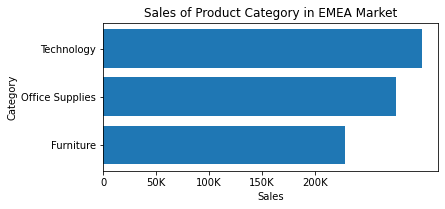

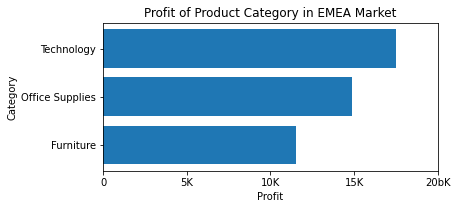

In [109]:
plt.figure(figsize=(6,6))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = emea_cat_sales.index,
    values = emea_cat_sales['Sales'],
    title = "Sales of Product Category in EMEA Market",
        tick = (0,50000,100000,150000,200000),
        label = ('0','50K','100K','150K','200K'),
        labelx = 'Sales',
        labely = "Category"
)


plt.figure(figsize=(6,6))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = emea_cat_profit.index,
    values = emea_cat_profit['Profit'],
    title = "Profit of Product Category in EMEA Market",
        tick = (0,5000,10000,15000,20000),
        label = ('0','5K','10K','15K','20bK'),
        labelx = 'Profit',
        labely = "Category"
)

After analyzing the sales and profit by country, segment and category, we want to look at the impact discount has on sales and profit in the EMEA market. We will use a sample of 300 orders for this test but we will first remove outliers before taking the sample. This is to ensure that the results are not influenced by outliers.

##### Statistical test
Given that we have two set of numeric values, Sales and Discount, that are both absolute zero measures and we want to assess the relationship between the scores, the appropriate statistical test to use is the Pearson r correlation coefficient.

##### Hypotheses

Null Hypothesis: There is no positive relationship between Discount and Sales in the EU market

Alternative Hypothesis: There is a positive relationship between Discount and Sales in the EU market

##### Decision Rules
Given:
* 0.05 level of significance
* a one-tailed Pearson r test

df = n-2 
   
   = 300 - 2
   
   = 298
   
The critical values for r in the r tables is +/- 0.095.

Therefore:

if r-obs < 0.095, retain the null hypotheses, and

if r-obs >= 0.095. reject the null hypotheses


##### Computation

In [110]:
emea_no_outliers = outlier_dropper(emea_df)
emea_no_outliers

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
2,48883,HU-2011-1220,2011-01-01,5/1/2011,Second Class,AT-735,Annie Thurman,Consumer,Budapest,Budapest,...,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",66.12,4,0.00,29.64,8.17,High
12,41445,IR-2011-6550,2011-01-02,6/2/2011,Standard Class,PO-8850,Patrick O'Brill,Consumer,Mashhad,Razavi Khorasan,...,FUR-ADV-10002601,Furniture,Furnishings,"Advantus Photo Frame, Erganomic",309.60,6,0.00,148.50,19.65,High
37,44502,UP-2011-3090,2011-01-03,1/3/2011,Same Day,BS-1800,Bryan Spruell,Home Office,Kherson,Kherson,...,FUR-HON-10002424,Furniture,Chairs,"Hon Steel Folding Chair, Red",162.84,2,0.00,76.50,24.42,Medium
38,44503,UP-2011-3090,2011-01-03,1/3/2011,Same Day,BS-1800,Bryan Spruell,Home Office,Kherson,Kherson,...,OFF-FEL-10002897,Office Supplies,Storage,"Fellowes Shelving, Single Width",115.74,2,0.00,30.06,19.52,Medium
41,48597,UP-2011-3730,2011-01-03,5/3/2011,Standard Class,RD-9900,Ruben Dartt,Consumer,Vinnytsya,Vinnytsya,...,TEC-KON-10002194,Technology,Machines,"Konica Printer, White",266.25,1,0.00,79.86,16.22,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51249,41744,TU-2014-5170,2014-12-31,4/1/2015,Second Class,VD-11670,Valerie Dominguez,Consumer,Konya,Konya,...,FUR-TEN-10000558,Furniture,Furnishings,"Tenex Frame, Erganomic",173.76,4,0.60,-117.36,13.72,Medium
51255,44026,RS-2014-1460,2014-12-31,2/1/2015,Second Class,PB-9105,Peter Bühler,Consumer,Ufa,Bashkortostan,...,FUR-RUB-10004420,Furniture,Furnishings,"Rubbermaid Door Stop, Black",43.80,1,0.00,13.56,9.81,High
51258,48786,UP-2014-3330,2014-12-31,2/1/2015,First Class,FW-4395,Fred Wasserman,Corporate,Mykolayiv,Mykolayiv,...,OFF-OIC-10004536,Office Supplies,Fasteners,"OIC Thumb Tacks, Assorted Sizes",138.24,12,0.00,55.08,8.03,Medium
51274,41743,TU-2014-5170,2014-12-31,4/1/2015,Second Class,VD-11670,Valerie Dominguez,Consumer,Konya,Konya,...,TEC-SAN-10004215,Technology,Accessories,"SanDisk Keyboard, Bluetooth",32.59,1,0.60,-25.28,3.40,Medium


With the outliers removed we will go ahead to take our sample

In [111]:
i = 1
while i < 4:
    # taking sample
    sample = emea_no_outliers.sample(300)
    # assigning discount to x
    x = sample['Discount']
    # assigning sales to y
    y = sample['Sales']
    # computing correlation coefficient
    corr = np.corrcoef(x,y)
    # displaying correlation coefficient
    print(corr)
    i += 1

[[ 1.         -0.08588664]
 [-0.08588664  1.        ]]
[[ 1.         -0.17968779]
 [-0.17968779  1.        ]]
[[ 1.        -0.2250554]
 [-0.2250554  1.       ]]


The correlation coefficients are -0.21,-0.15 and -0.09.

We will compare these values to the decision rules.

##### Descision

Since for each sample, the r-obs is less than 0.095, we fail to reject the null hypotheses.

##### Interpretation

Therefore we conclude that, discount has no positive or a negative relationship with sales in the APAC market. However the relationship is a weak one.
Thus, an increase in discount in the EMEA market will decrease sales by a small margin.

## LATAM Market Analysis
We will extract the orders in the LATAM market into a different dataframe

In [112]:
latam_df = df.query('Market == "LATAM"')
latam_df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
11,8483,US-2011-118892,2011-01-02,6/2/2011,Standard Class,DH-13075,Dave Hallsten,Corporate,San Miguelito,Panama,...,OFF-AP-10002317,Office Supplies,Appliances,"Hamilton Beach Refrigerator, Silver",400.70,2,0.40,20.02,21.38,Medium
15,8484,US-2011-118892,2011-01-02,6/2/2011,Standard Class,DH-13075,Dave Hallsten,Corporate,San Miguelito,Panama,...,TEC-AC-10001221,Technology,Accessories,"Memorex Memory Card, USB",81.98,2,0.40,-19.14,6.21,Medium
22,8482,US-2011-118892,2011-01-02,6/2/2011,Standard Class,DH-13075,Dave Hallsten,Corporate,San Miguelito,Panama,...,OFF-BI-10000719,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",9.58,6,0.40,-0.98,0.81,Medium
80,592,US-2011-132899,2011-01-04,5/4/2011,Second Class,JB-15400,Jennifer Braxton,Corporate,Lima,Lima (city),...,TEC-PH-10002871,Technology,Phones,"Motorola Audio Dock, with Caller ID",138.70,2,0.40,-25.46,20.40,Medium
82,3683,US-2011-148852,2011-01-04,4/4/2011,Second Class,VP-21760,Victoria Pisteka,Corporate,Arraiján,Panama,...,OFF-AP-10002753,Office Supplies,Appliances,"Cuisinart Toaster, Red",85.54,4,0.40,-47.10,11.56,High


In [113]:
latam_df[['Sales']].sum()

Sales   2164605.17
dtype: float64

In [114]:
latam_df[['Profit']].sum()

Profit   221643.49
dtype: float64

## Checking countries in the LATAM region¶

In [115]:
latam_df['Country'].value_counts()

Mexico                 2644
Brazil                 1599
Dominican Republic      742
El Salvador             736
Cuba                    724
Honduras                713
Nicaragua               614
Guatemala               521
Argentina               390
Panama                  388
Colombia                360
Venezuela               194
Peru                    162
Chile                   143
Haiti                   104
Ecuador                  56
Bolivia                  48
Jamaica                  31
Trinidad and Tobago      30
Barbados                 26
Martinique               25
Uruguay                  24
Paraguay                 12
Guadeloupe                8
Name: Country, dtype: int64

Mexico is the country with the most orders and Guadeloupe has the least. We will isolates the top 5 and bottom 5 performing countries in the LATAM market¶

### Top 5 Countries by Sales

In [116]:
sales_top_5 = latam_df.groupby('Country')['Sales'].sum().nlargest(5)
latam_top_5 = sales_top_5.sort_values(ascending=False).to_frame()
latam_top_5

,Sales
Country,
Mexico,622590.62
Brazil,361106.42
El Salvador,177554.90
Cuba,158854.94
Nicaragua,149687.06


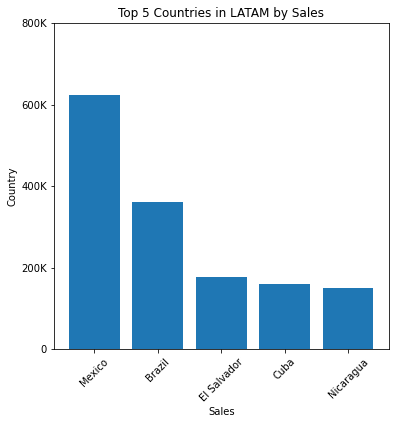

In [117]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = latam_top_5.index,
        values = latam_top_5['Sales'],
        title = "Top 5 Countries in LATAM by Sales",
        tick = (0,200000,400000,600000,800000),
        label = ('0','200K','400K','600K','800K'),
        labelx = "Sales",
        labely = "Country")

Mexico, Brazil, El Salvador, Cuba, Nicaragua are the best performing countries in the LATAM region in terms of Sales

### Top LATAM Countries by Profit

In [118]:
profit_top_5= latam_df.groupby('Country')['Profit'].sum().nlargest(5)
latam_top_5_profit = profit_top_5.sort_values(ascending=False).to_frame()
latam_top_5_profit

,Profit
Country,
Mexico,102818.10
El Salvador,42023.24
Cuba,38889.22
Nicaragua,33401.44
Brazil,30090.50


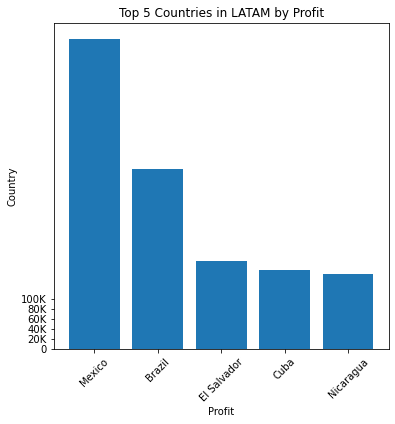

In [119]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = latam_top_5.index,
        values = latam_top_5['Sales'],
        title = "Top 5 Countries in LATAM by Profit",
        tick = (0,20000,40000,60000,80000,100000),
        label = ('0','20K','40K','60K','80K','100K'),
        labelx = "Profit",
        labely = "Country")

In terms of profit, Mexico, Brazil, El Salvador, Cuba and Nicaragua are the best performing countries in terms of profit in the LATAM region

We will check the best performing segments in LATAM by sales and profit

In [120]:
# segment by sales
latam_segs_sales = latam_df.groupby('Segment')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
latam_segs_sales

,Sales
Segment,
Consumer,1133847.03
Corporate,645252.48
Home Office,385505.65


In [121]:
#segment by profit 
latam_segs_pro = apac_df.groupby('Segment')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
latam_segs_pro

,Profit
Segment,
Consumer,222817.56
Corporate,129737.23
Home Office,83445.25


In [122]:
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(latam_segs_sales['Sales'],
        autopct='%.1f%%',
        labels=latam_segs_sales.index)
plt.title("Segment Sales at the LATAM region")


plt.subplot(1,2,2)
plt.pie(latam_segs_pro['Profit'],
        autopct='%.1f%%',
        labels=latam_segs_pro.index)
plt.title("Segment Profit at the LATAM region")
plt.show()

In the LATAM region, Consumer tops the charts in terms of both the sales and profits
Moving on to the specific categories of products that contribute the sales and profits in the region

In [123]:
latam_cat_sales = apac_df.groupby('Category')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
latam_cat_sales

,Sales
Category,
Furniture,1343934.07
Office Supplies,884319.83
Technology,1357490.23


In [124]:
latam_cat_pro = apac_df.groupby('Category')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
latam_cat_pro

,Profit
Category,
Furniture,125896.15
Office Supplies,105510.04
Technology,204593.86


Visualising the sales and profits of the top performing categories

In [125]:
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(latam_cat_sales["Sales"],
        autopct='%.1f%%',
        labels=latam_cat_sales.index)
plt.title("Category Sales at the LATAM Region")


plt.subplot(1,2,2)
plt.pie(latam_cat_pro['Profit'],
        autopct='%.1f%%',
        labels=latam_cat_pro.index)
plt.title("Category Profit at the LATAM Region")
plt.show()

Technology is the top performing category in the LATAM market in terms of both sales (contributes37.9%) and profit (contributes 46.9%)

Let's Consider Worst Performing Countries within the LATAM market


In [126]:
latam_sales_bot_5 = latam_df.groupby('Country')['Sales'].sum().sort_values(ascending=False).tail().to_frame()

latam_sales_bot_5

,Sales
Country,
Trinidad and Tobago,6881.16
Jamaica,6761.79
Martinique,5968.15
Paraguay,2590.37
Guadeloupe,1461.64


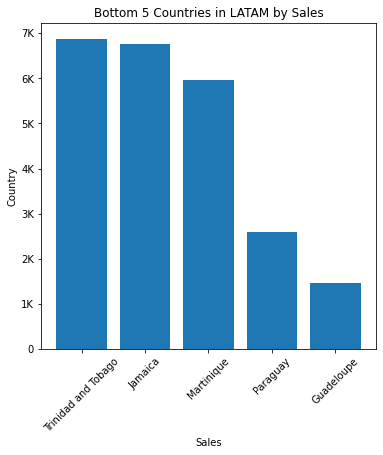

In [127]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = latam_sales_bot_5.index,
        values = latam_sales_bot_5['Sales'],
        title = "Bottom 5 Countries in LATAM by Sales",
        tick = (0,1000,2000,3000,4000,5000,6000,7000),
        label = ('0','1K','2K','3K','4K','5K','6K','7K'),
        labelx = "Sales",
        labely = "Country")

Trinidad and Tobago, Jamaica, Martinique, Paraguay, Guadelope are the worst performing LATAM countries in terms of sales

###### Bottom 5 by profit

In [128]:
latam_pro_bot_5 = latam_df.groupby('Country')['Profit'].sum().sort_values(ascending=False).tail().to_frame()
latam_pro_bot_5

,Profit
Country,
Dominican Republic,-7613.50
Venezuela,-11222.71
Panama,-17723.45
Argentina,-18693.80
Honduras,-29482.37


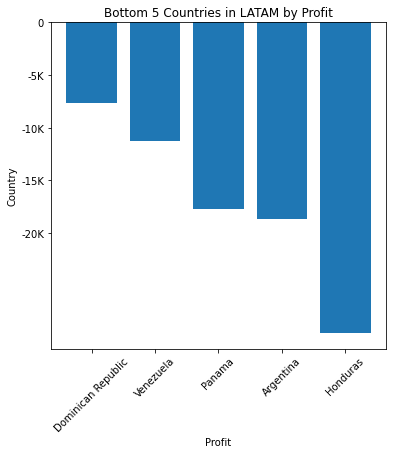

In [129]:
plt.figure(figsize=(6,6))
plot_bar(types = 'bar',
        index = latam_pro_bot_5.index,
        values = latam_pro_bot_5['Profit'],
        title = "Bottom 5 Countries in LATAM by Profit",
        tick = (0,-5000,-10000,-15000,-20000),
        label = ('0','-5K','-10K','-15K','-20K'),
        labelx = "Profit",
        labely = "Country")

After analyzing the sales and profit by country, segment and category, we want to look at the impact discount has on sales and profit in the LATAM market. We will use a sample of 300 orders for this test but we will first remove outliers before taking the sample. This is to ensure that the results are not influenced by outliers.

##### Statistical test
Given that we have two set of numeric values, Sales and Discount, that are both absolute zero measures and we want to assess the relationship between the scores, the appropriate statistical test to use is the Pearson r correlation coefficient.

##### Hypotheses

Null Hypothesis: There is no positive relationship between Discount and Sales in the Africa market

Alternative Hypothesis: There is a positive relationship between Discount and Sales in the Africa market

##### Decision Rules
Given:
* 0.05 level of significance
* a one-tailed Pearson r test

df = n-2 
   
   = 300 - 2
   
   = 298
   
The critical values for r in the r tables is +/- 0.095.

Therefore:

if r-obs < 0.095, retain the null hypotheses, and

if r-obs >= 0.095. reject the null hypotheses


##### Computation

We will calculate for outliers and remove them. We first check for outliers in the sales and discount column.

In [130]:
latam_no_outliers = outlier_dropper(latam_df)
latam_no_outliers

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
11,8483,US-2011-118892,2011-01-02,6/2/2011,Standard Class,DH-13075,Dave Hallsten,Corporate,San Miguelito,Panama,...,OFF-AP-10002317,Office Supplies,Appliances,"Hamilton Beach Refrigerator, Silver",400.70,2,0.40,20.02,21.38,Medium
15,8484,US-2011-118892,2011-01-02,6/2/2011,Standard Class,DH-13075,Dave Hallsten,Corporate,San Miguelito,Panama,...,TEC-AC-10001221,Technology,Accessories,"Memorex Memory Card, USB",81.98,2,0.40,-19.14,6.21,Medium
22,8482,US-2011-118892,2011-01-02,6/2/2011,Standard Class,DH-13075,Dave Hallsten,Corporate,San Miguelito,Panama,...,OFF-BI-10000719,Office Supplies,Binders,"Wilson Jones Hole Reinforcements, Clear",9.58,6,0.40,-0.98,0.81,Medium
80,592,US-2011-132899,2011-01-04,5/4/2011,Second Class,JB-15400,Jennifer Braxton,Corporate,Lima,Lima (city),...,TEC-PH-10002871,Technology,Phones,"Motorola Audio Dock, with Caller ID",138.70,2,0.40,-25.46,20.40,Medium
82,3683,US-2011-148852,2011-01-04,4/4/2011,Second Class,VP-21760,Victoria Pisteka,Corporate,Arraiján,Panama,...,OFF-AP-10002753,Office Supplies,Appliances,"Cuisinart Toaster, Red",85.54,4,0.40,-47.10,11.56,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51277,7200,MX-2014-141712,2014-12-31,31-12-2014,Same Day,RB-19465,Rick Bensley,Home Office,Managua,Managua,...,OFF-ST-10002122,Office Supplies,Storage,"Smead Box, Industrial",15.00,2,0.00,1.20,2.34,Critical
51278,5029,MX-2014-168851,2014-12-31,2/1/2015,Second Class,SC-20260,Scott Cohen,Corporate,Durango,Durango,...,OFF-LA-10004094,Office Supplies,Labels,"Avery Removable Labels, 5000 Label Set",22.26,3,0.00,3.96,2.27,High
51284,2143,MX-2014-108574,2014-12-31,4/1/2015,Standard Class,JB-16045,Julia Barnett,Home Office,Reynosa,Tamaulipas,...,OFF-LA-10004969,Office Supplies,Labels,"Novimex Legal Exhibit Labels, Adjustable",16.74,3,0.00,0.66,1.32,Medium
51287,8857,MX-2014-110527,2014-12-31,2/1/2015,Second Class,CM-12190,Charlotte Melton,Consumer,Managua,Managua,...,OFF-LA-10004182,Office Supplies,Labels,"Hon Color Coded Labels, 5000 Label Set",26.40,3,0.00,12.36,0.35,Medium


In [131]:
i = 1
while i < 4:
    # taking sample
    sample = emea_no_outliers.sample(300)
    # assigning discount to x
    x = sample['Discount']
    # assigning sales to y
    y = sample['Sales']
    # computing correlation coefficient
    corr = np.corrcoef(x,y)
    # displaying correlation coefficient
    print(corr)
    i += 1

[[ 1.         -0.16439394]
 [-0.16439394  1.        ]]
[[ 1.         -0.23391344]
 [-0.23391344  1.        ]]
[[ 1.         -0.19486959]
 [-0.19486959  1.        ]]


The correlation coefficients are -0.21,-0.15 and -0.09.

We will compare these values to the decision rules.

##### Descision

Since for each sample, the r-obs is less than 0.095, we fail to reject the null hypotheses.

##### Interpretation

Therefore we conclude that, discount has no positive or a negative relationship with sales in the APAC market. However the relationship is a weak one.
Thus, an increase in discount in the LATAM market will decrease sales by a small margin.

# Africa Market Analysis

We will extract the orders in the Africa market into a separate dataframe.

In [132]:
africa_df = df.query('Market == "Africa"')
africa_df

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
0,42433,AG-2011-2040,2011-01-01,6/1/2011,Standard Class,TB-11280,Toby Braunhardt,Consumer,Constantine,Constantine,...,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",408.30,2,0.00,106.14,35.46,Medium
8,44508,AO-2011-1390,2011-01-02,4/2/2011,Second Class,DK-3150,David Kendrick,Corporate,Luanda,Luanda,...,OFF-FEL-10001541,Office Supplies,Storage,"Fellowes Lockers, Wire Frame",206.40,1,0.00,92.88,53.08,Critical
74,50129,NI-2011-190,2011-01-03,6/3/2011,Standard Class,EH-3765,Edward Hooks,Corporate,Kano,Kano,...,OFF-HOO-10002386,Office Supplies,Appliances,"Hoover Toaster, Silver",25.32,1,0.70,-28.71,0.79,Medium
137,44800,SO-2011-3360,2011-01-06,4/6/2011,Second Class,AJ-945,Ashley Jarboe,Consumer,Mogadishu,Banaadir,...,OFF-STO-10000683,Office Supplies,Fasteners,"Stockwell Thumb Tacks, Assorted Sizes",21.18,2,0.00,5.88,1.56,Medium
139,44799,SO-2011-3360,2011-01-06,4/6/2011,Second Class,AJ-945,Ashley Jarboe,Consumer,Mogadishu,Banaadir,...,OFF-ADV-10004875,Office Supplies,Fasteners,"Advantus Staples, Bulk Pack",10.86,1,0.00,4.32,0.74,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51252,42474,OD-2014-9490,2014-12-31,5/1/2015,Standard Class,MW-8235,Mitch Willingham,Corporate,Juba,Central Equatoria,...,TEC-CAN-10004291,Technology,Copiers,"Canon Wireless Fax, Digital",378.30,1,0.00,166.44,11.71,Medium
51253,45582,AO-2014-7730,2014-12-31,4/1/2015,Standard Class,KL-6645,Ken Lonsdale,Consumer,Luanda,Luanda,...,OFF-SAN-10001094,Office Supplies,Paper,"SanDisk Memo Slips, 8.5 x 11",126.72,6,0.00,20.16,11.50,High
51262,50446,TZ-2014-8350,2014-12-31,3/1/2015,First Class,JA-5970,Joseph Airdo,Consumer,Dar es Salaam,Dar Es Salaam,...,OFF-FEL-10001792,Office Supplies,Storage,"Fellowes Folders, Wire Frame",22.92,1,0.10,4.05,6.11,High
51280,50234,TZ-2014-8220,2014-12-31,6/1/2015,Standard Class,CK-2325,Christine Kargatis,Home Office,Dar es Salaam,Dar Es Salaam,...,OFF-HAR-10001531,Office Supplies,Labels,"Harbour Creations Removable Labels, Adjustable",49.50,6,0.00,6.84,2.15,Medium


In [133]:
africa_sales = africa_df['Sales'].sum()
print('Total sales in APAC: {:.2f}'.format(africa_sales))

Total sales in APAC: 783773.21


In [134]:
africa_pro = africa_df['Profit'].sum()
print('Total profit in APAC: {:.2f}'.format(africa_pro))

Total profit in APAC: 88871.63


We will now breakdown the Africa market into countries to assess the impact the countries are having on sales and profit in the Africa market.

We start by checking the number of orders per country.

In [135]:
africa_df['Country'].value_counts()

Nigeria                             905
Egypt                               487
South Africa                        461
Morocco                             451
Democratic Republic of the Congo    379
Algeria                             196
Tanzania                            148
Angola                              122
Senegal                             112
Cameroon                            110
Cote d'Ivoire                       109
Ghana                               102
Zambia                              102
Kenya                                98
Mozambique                           94
Sudan                                92
Zimbabwe                             80
Madagascar                           56
Somalia                              52
Togo                                 44
Mali                                 43
Niger                                43
Libya                                39
Uganda                               37
Rwanda                               36


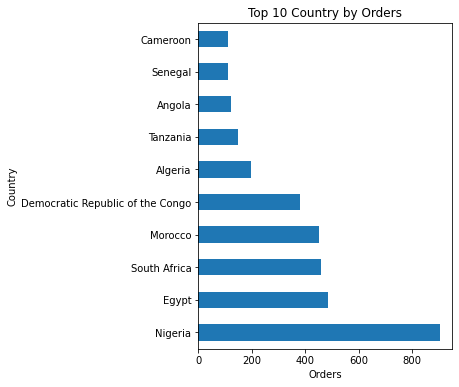

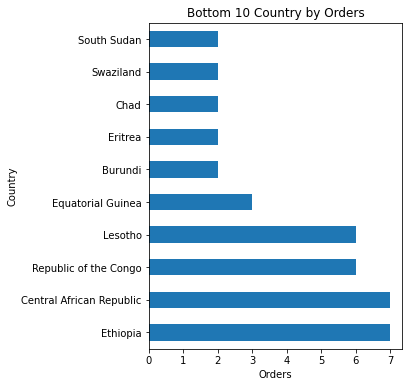

In [136]:
plt.figure(figsize= (10,6))
plt.subplot(1,2,1)
africa_df['Country'].value_counts().head(10).plot(kind='barh')
plt.title("Top 10 Country by Orders")
plt.xlabel("Orders")
plt.ylabel("Country")

plt.figure(figsize= (10,6))
plt.subplot(1,2,2)
africa_df['Country'].value_counts().tail(10).plot(kind='barh')
plt.title("Bottom 10 Country by Orders")
plt.xlabel("Orders")
plt.ylabel("Country");

In the Africa market, Nigeria is the country with the most orders while Burundi, Eritrea, Chad, Swaziland and South Sudan are the countries with the least orders. We will proceed to investigate the top 5 countries and bottom 5 countries in terms of sales and profit.

##### Top 5 Countries by Sales

In [137]:
sales_top_5 = africa_df.groupby('Country')['Sales'].sum().nlargest(5)
africa_top_sales = sales_top_5.sort_values(ascending=True).to_frame()
africa_top_sales

,Sales
Country,
Nigeria,54350.35
Egypt,84139.32
Morocco,87077.94
Democratic Republic of the Congo,87416.58
South Africa,95292.27


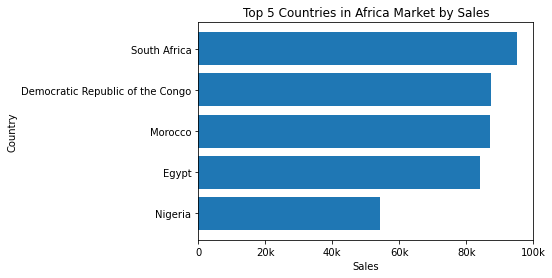

In [138]:
plot_bar(
    types='barh',
    index=africa_top_sales.index,
    values=africa_top_sales['Sales'],
    title= "Top 5 Countries in Africa Market by Sales",
    tick = (0,20000,40000,60000,80000,100000),
    label = ('0','20k','40k','60k','80k','100k'),
    labelx = 'Sales',
    labely = "Country")

South Africa, Demographic Republic of the Congo, Morocco, Egypt and Nigeria are the best performing countries in the Africa region in terms of sales. We will investigate the best performing countries in terms of profit.

##### Top 5 Countries by Profit

In [139]:
profit_top_5 = africa_df.groupby('Country')['Profit'].sum().nlargest(5)
africa_top_5_profit = profit_top_5.sort_values(ascending=True).to_frame()
africa_top_5_profit

,Profit
Country,
Algeria,9106.50
Egypt,19702.23
Democratic Republic of the Congo,21860.58
South Africa,21936.63
Morocco,22761.42


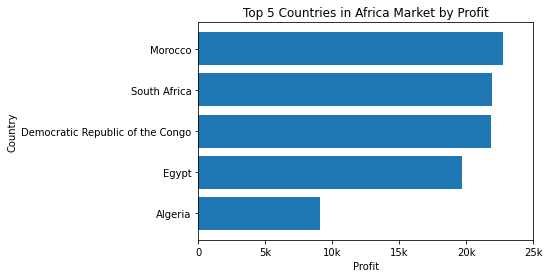

In [140]:
#Plotting this on a bar chart
plot_bar(
    types='barh',
    index=africa_top_5_profit.index,
    values=africa_top_5_profit['Profit'],
    title= "Top 5 Countries in Africa Market by Profit",
    tick = (0,5000,10000,15000,20000,25000),
    label = ('0','5k','10k','15k','20k','25k'),
    labelx = 'Profit',
    labely = "Country")

Morocco, South Africa, Demographic Republic of the Congo,  Egypt and Algeria are the best performing countries in the Africa region in terms of profit. 

We will check the best performing segments and categories in the Africa region by sales and profit.

In [141]:
africa_segs_sales = africa_df.groupby('Segment')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
africa_segs_sales

,Sales
Segment,
Consumer,423766.81
Corporate,204938.95
Home Office,155067.45


We will check the segments by profit before plotting the visuals.

In [142]:
africa_segs_profit = africa_df.groupby('Segment')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
africa_segs_profit

,Profit
Segment,
Consumer,47772.10
Corporate,20686.97
Home Office,20412.57


In [143]:
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(africa_segs_sales['Sales'],
        autopct='%.1f%%',
        labels=africa_segs_sales.index)
plt.title("Sales by Segment")


plt.subplot(1,2,2)
plt.pie(africa_segs_profit['Profit'],
        autopct='%.1f%%',
        labels=africa_segs_profit.index)
plt.title("Profit by Segment")
plt.show()

For both profit and sales, Consumer is the best performing Segment in the Africa market. This is followed by the Corporate segment then the Home Office Segment.

We will now look at the categories in terms of profit and sales.

For both profit and sales, Consumer is the best performing Segment in the Africa market. This is followed by the Corporate segment then the Home Office Segment.

We will now look at the categories in terms of profit and sales.


In [144]:
africa_cat_sales = africa_df.groupby('Category')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
africa_cat_sales

,Sales
Category,
Furniture,194650.64
Office Supplies,266755.53
Technology,322367.04


In [145]:
africa_cat_profit = africa_df.groupby('Category')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
africa_cat_profit

,Profit
Category,
Furniture,16262.09
Office Supplies,28480.05
Technology,44129.49


In [146]:
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(africa_cat_sales['Sales'],
        autopct='%.1f%%',
        labels=africa_cat_sales.index)
plt.title("Product Category by Sales")


plt.subplot(1,2,2)
plt.pie(africa_cat_profit['Profit'],
        autopct='%.1f%%',
        labels=africa_cat_profit.index)
plt.title("Product Category by Profit")
plt.show()

##### Sales
Technology is the best performing category by sales with 41.1% of total sales in the Africa market. It is closely followed by Office Supplies which accounted for 34.0% of total sales. Furniture accounted for the remaining 24.8% of total sales.

##### Profit
Technology accounted for 49.7% of total profit. Office Supplies and Furniture accounted for 32.0% and 18.3% of total profit respectively.

We will now look at the bottom 5 countries with the least sales and prifit in the Africa market.

##### Bottom 5 countries in Africa Market

In [147]:
bot_5_sales= africa_df.groupby('Country')['Sales'].sum().sort_values(ascending=False).tail().to_frame()
bot_5_sales

,Sales
Country,
Ethiopia,850.62
Swaziland,288.03
Burundi,267.72
Eritrea,187.74
Equatorial Guinea,150.51


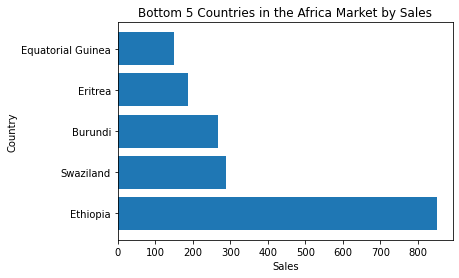

In [148]:
plot_bar(
    types='barh',
    index=bot_5_sales.index,
    values=bot_5_sales["Sales"],
    title= "Bottom 5 Countries in the Africa Market by Sales",
    tick = (0,100,200,300,400,500,600,700,800),
    label = ('0','100','200','300','400','500','600','700','800'),
    labelx = 'Sales',
    labely = "Country")

Ethopia, Swaziland, Burundi,Eritrea and Equatorial Guinea are the least performing countries in terms of sales.

We now look at profit.

In [149]:
bot_5_profit = africa_df.groupby('Country')['Profit'].sum().sort_values(ascending=False).tail().to_frame()
bot_5_profit

,Profit
Country,
Eritrea,76.20
Equatorial Guinea,44.46
Uganda,-2426.09
Zimbabwe,-5428.78
Nigeria,-80750.72


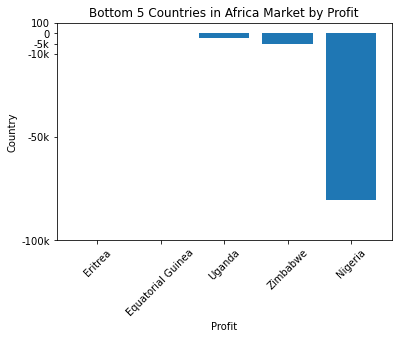

In [150]:

plot_bar(
    types='bar',
    index=bot_5_profit.index,
    values=bot_5_profit['Profit'],
    title= "Bottom 5 Countries in Africa Market by Profit",
    tick = (-100000,-50000,-10000,-5000,0,5000),
    label = ('-100k','-50k','-10k','-5k','0','100'),
    labelx = 'Profit',
    labely = "Country")

Nigeria, Zimbabwe and Uganda are the countries making heavy losses in the Africa market. However, Eritrea and Equatoria Guinea are making the least profit of `$76.20` and `$44.46` respectively.

We want to assess the relationship between Discount and Sales in the Africa. We will first check the total discount in Africa.

In [151]:
print(f"Total discount: {africa_df['Discount'].sum()}")

Total discount: 718.8


checking for outliers in the discount column

In [152]:
q1, q3= np.percentile(africa_df['Discount'],[25,75])
iqr = q3 - q1

low_bound= q1 - (iqr * 1.5)
print(f' lower bound = {low_bound}')

upper_bound= q3 + (iqr * 1.5)
print(f' Upper bound = {upper_bound}')


 lower bound = 0.0
 Upper bound = 0.0


Removing the outliers from the discount means removing the entire records for discount in the Africa market.
Then we conclude that the hypothesis test is not feasible in this market.

### Canada Market Analysis

We will extract the orders in the Canada market into a separate dataframe.

In [153]:
canada_df = df.query('Market == "Canada"')
canada_df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,...,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority
23,44228,CA-2011-1800,2011-01-03,4/3/2011,First Class,TP-11415,Tom Prescott,Consumer,Toronto,Ontario,...,OFF-FEL-10001405,Office Supplies,Storage,"Fellowes File Cart, Industrial",551.16,4,0.00,71.64,164.36,High
28,44230,CA-2011-1800,2011-01-03,4/3/2011,First Class,TP-11415,Tom Prescott,Consumer,Toronto,Ontario,...,FUR-HAR-10001792,Furniture,Chairs,"Harbour Creations Bag Chairs, Red",246.48,4,0.00,105.96,65.81,High
39,44229,CA-2011-1800,2011-01-03,4/3/2011,First Class,TP-11415,Tom Prescott,Consumer,Toronto,Ontario,...,TEC-APP-10004912,Technology,Phones,"Apple Speaker Phone, with Caller ID",493.20,4,0.00,123.24,18.19,High
55,44227,CA-2011-1800,2011-01-03,4/3/2011,First Class,TP-11415,Tom Prescott,Consumer,Toronto,Ontario,...,OFF-ACC-10004692,Office Supplies,Binders,"Acco 3-Hole Punch, Recycled",30.48,1,0.00,2.73,6.70,High
63,44225,CA-2011-1800,2011-01-03,4/3/2011,First Class,TP-11415,Tom Prescott,Consumer,Toronto,Ontario,...,OFF-OIC-10002161,Office Supplies,Fasteners,"OIC Push Pins, Assorted Sizes",12.36,1,0.00,2.46,3.10,High


In [154]:
can_sls = canada_df['Sales'].sum()
print(f'Total Sales in Canada: {can_sls}')

Total Sales in Canada: 66928.17


In [155]:
can_pro = canada_df['Profit'].sum()
print(f'Total Profit in Canada: {can_pro}')

Total Profit in Canada: 17817.39


Even though Canada is a market, it is also a country. Therefore in Canada, we will perform our analysis on the states.

We start by checking the number of orders by state.

In [156]:
# value counts of states
canada_df["State"].value_counts()

Ontario             198
Quebec               57
Alberta              49
British Columbia     46
Saskatchewan         16
Manitoba             14
Nova Scotia           3
Newfoundland          1
Name: State, dtype: int64

Text(0, 0.5, 'Orders')

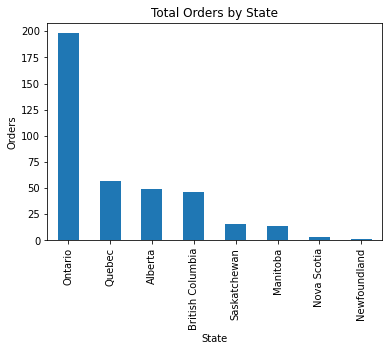

In [157]:
#plotting value counts on a bar chart
canada_df["State"].value_counts().plot(kind='bar')
plt.title('Total Orders by State')
plt.xlabel('State')
plt.ylabel('Orders')

In the Canada market, Ontario is the state with the most orders while Newfoundland is the state with the least orders. We will proceed to investigate the states in terms of sales and profit.

### Sales by state

In [158]:
state_sales = canada_df.groupby('State')['Sales'].sum().sort_values(ascending=False)
state_sales.to_frame()

,Sales
State,
Ontario,35450.40
Quebec,10924.17
British Columbia,9544.38
Alberta,6550.86
Manitoba,2017.62
Saskatchewan,1955.58
Nova Scotia,382.32
Newfoundland,102.84


We will plot this on a bar chart.

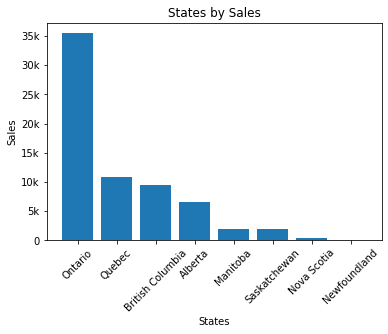

In [159]:
plot_bar(types = 'bar', 
         index = state_sales.index,
         values = state_sales,
         title = 'States by Sales',
        tick = (0, 5000, 10000, 15000, 20000, 25000, 30000, 35000),
        label = ('0', '5k', '10k', '15k', '20k', '25k', '30k', '35k'), 
         labelx = 'States',
         labely = 'Sales')

Ontario, Quebec and British Columbia are the best performing states in the Canada Market in terms of sales. We will investigate the best perforimg countries in terms of profit.

#### states by Profit

In [160]:
state_profit = canada_df.groupby('State')['Profit'].sum().sort_values(ascending=False).to_frame()
state_profit

,Profit
State,
Ontario,9079.50
Quebec,2961.42
British Columbia,2695.47
Alberta,1963.59
Manitoba,662.46
Saskatchewan,404.91
Nova Scotia,40.80
Newfoundland,9.24


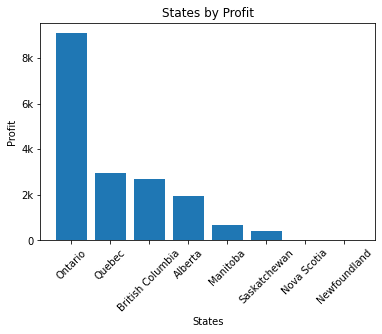

In [161]:
plot_bar(types = 'bar',
         index = state_profit.index,
         values = state_profit['Profit'], 
         title = 'States by Profit',
        tick = (0, 2000, 4000, 6000, 8000),
        label = ('0', '2k', '4k', '6k', '8k'),
        labelx = 'States',
        labely = 'Profit')

Ontario, Quebec and British Columbia are the best performing states in the Canada Market in terms of profit.

We will check the best performing segments and categories in the Canada market by sales and profit.

In [162]:
canada_segs_sales = canada_df.groupby('Segment')['Sales'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
canada_segs_sales

,Sales
Segment,
Consumer,35719.11
Corporate,19313.73
Home Office,11895.33


We will check the segments by profit before plotting the visuals.


In [163]:
canada_segs_profit = canada_df.groupby('Segment')['Profit'].sum().to_frame()
pd.set_option('display.float_format',lambda x : f'{x:.2f}')
canada_segs_profit

,Profit
Segment,
Consumer,9677.70
Corporate,5036.46
Home Office,3103.23


In [164]:
#plotting pie chart
plt.figure(figsize=(10,10),dpi=1600)
plt.subplot(1,2,1)
plt.pie(canada_segs_sales['Sales'],
        autopct='%.1f%%',
        labels=canada_segs_sales.index)
plt.title("Sales")


plt.subplot(1,2,2)
plt.pie(canada_segs_profit['Profit'],
        autopct='%.1f%%',
        labels=canada_segs_profit.index)
plt.title("Profit")
plt.show()

In terms of profit and sales, Consumer is the best performing Segment in the Canada market. This is followed by the Corporate segment then the Home Office Segment. 

We will now look at the categories in terms of profit and sales.

In [165]:
# Category by Sales
canada_cat_sales = canada_df.groupby('Category')['Sales'].sum().sort_values(ascending=True).to_frame()
canada_cat_sales

,Sales
Category,
Furniture,10595.28
Technology,26298.81
Office Supplies,30034.08


In [166]:
# Category by Profit
canada_cat_pro = canada_df.groupby('Category')['Profit'].sum().sort_values(ascending=True).to_frame()
canada_cat_pro

,Profit
Category,
Furniture,2613.24
Technology,7246.62
Office Supplies,7957.53


We will plot the distribution of sales and profit by category on horizontal bar charts.

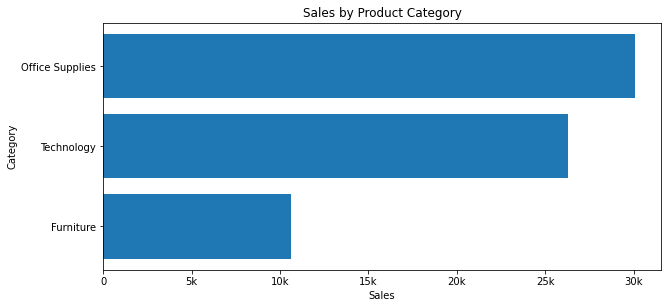

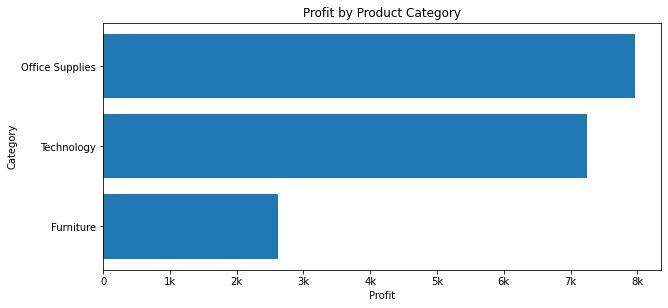

In [167]:
# plotting sales by category
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = canada_cat_sales.index,
    values = canada_cat_sales['Sales'],
    title = "Sales by Product Category",
        tick =  (0, 5000, 10000, 15000, 20000, 25000, 30000),
        label = ('0', '5k', '10k', '15k', '20k', '25k', '30k'),
        labelx = 'Sales',
        labely = "Category"
)

# plotting profit by category
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plot_bar(
    types = 'barh',
    index = canada_cat_pro.index,
    values = canada_cat_pro['Profit'],
    title = "Profit by Product Category",
        tick = (0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000),
        label = ('0', '1k', '2k', '3k', '4k', '5k', '6k', '7k', '8k'),
        labelx = 'Profit',
        labely = "Category"
)

##### Profit
Office Supplies brought in the highest profit of `$7957.53`. Technology and Furniture brought in `$7246.62` and `$2613.24` in profit respectively.

##### Sales
Office Supplies is the best performing category by sales in the Canada market with `$30,034.08` in sales. It is closely followed by Technology which had `$26,298.81` in sales. Lastly Furniture had a total of `$10,595.28` in sales.

We want to assess the relationship between Discount and Sales in the Canada. We will first check the total discount in Canada.

In [168]:
print(f"Total discount: {canada_df['Discount'].sum()}")

Total discount: 0.0


Seems no discounts were given in Canada therefore we can not assess the impact of discount there.

## Cohort Analysis


In [169]:
df.columns


Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'City', 'State', 'Country',
       'Market', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'Shipping Cost', 'Order Priority'],
      dtype='object')

##### selecting the columns we want to work with

In [170]:
data = df[['Customer ID','Sales','Order Date']]
data.head()

,Customer ID,Sales,Order Date
0,TB-11280,408.30,2011-01-01
1,JH-15985,120.37,2011-01-01
2,AT-735,66.12,2011-01-01
3,EM-14140,44.87,2011-01-01
4,JH-15985,113.67,2011-01-01


 We will define a function to get the month from the Order date

In [171]:
# define function
def get_month(x):
    '''truncates a given date object to the first day of the month'''
    return dt.datetime(x.year, x.month, 1)

In [172]:
# Apply the get month function to the InvoiceDate to create a new column InvoiceMonth
data["Order Month"] = data["Order Date"].apply(get_month)


C:\Users\ayers\AppData\Local\Temp\ipykernel_8460\894043102.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Order Month"] = data["Order Date"].apply(get_month)


In [173]:
data['Order Month'].unique()


array(['2011-01-01T00:00:00.000000000', '2011-02-01T00:00:00.000000000',
       '2011-03-01T00:00:00.000000000', '2011-04-01T00:00:00.000000000',
       '2011-05-01T00:00:00.000000000', '2011-06-01T00:00:00.000000000',
       '2011-07-01T00:00:00.000000000', '2011-08-01T00:00:00.000000000',
       '2011-09-01T00:00:00.000000000', '2011-10-01T00:00:00.000000000',
       '2011-11-01T00:00:00.000000000', '2011-12-01T00:00:00.000000000',
       '2012-01-01T00:00:00.000000000', '2012-02-01T00:00:00.000000000',
       '2012-03-01T00:00:00.000000000', '2012-04-01T00:00:00.000000000',
       '2012-05-01T00:00:00.000000000', '2012-06-01T00:00:00.000000000',
       '2012-07-01T00:00:00.000000000', '2012-08-01T00:00:00.000000000',
       '2012-09-01T00:00:00.000000000', '2012-10-01T00:00:00.000000000',
       '2012-11-01T00:00:00.000000000', '2012-12-01T00:00:00.000000000',
       '2013-01-01T00:00:00.000000000', '2013-02-01T00:00:00.000000000',
       '2013-03-01T00:00:00.000000000', '2013-04-01

In [174]:
data.head()

,Customer ID,Sales,Order Date,Order Month
0,TB-11280,408.30,2011-01-01,2011-01-01
1,JH-15985,120.37,2011-01-01,2011-01-01
2,AT-735,66.12,2011-01-01,2011-01-01
3,EM-14140,44.87,2011-01-01,2011-01-01
4,JH-15985,113.67,2011-01-01,2011-01-01


In [175]:
data['Customer ID'].nunique()

1590

In [176]:
grouping =data.groupby("Customer ID")["Order Month"]

In [177]:
# assigning acquisition month cohort
data["Cohort Month"] = grouping.transform(min)

C:\Users\ayers\AppData\Local\Temp\ipykernel_8460\2297321578.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Cohort Month"] = grouping.transform(min)


In [178]:
data.head(20)

,Customer ID,Sales,Order Date,Order Month,Cohort Month
0,TB-11280,408.30,2011-01-01,2011-01-01,2011-01-01
1,JH-15985,120.37,2011-01-01,2011-01-01,2011-01-01
2,AT-735,66.12,2011-01-01,2011-01-01,2011-01-01
3,EM-14140,44.87,2011-01-01,2011-01-01,2011-01-01
4,JH-15985,113.67,2011-01-01,2011-01-01,2011-01-01
5,JH-15985,55.24,2011-01-01,2011-01-01,2011-01-01
6,PO-18865,285.78,2011-01-02,2011-01-01,2011-01-01
7,LC-17050,290.67,2011-01-02,2011-01-01,2011-01-01
8,DK-3150,206.40,2011-01-02,2011-01-01,2011-01-01
9,SP-20650,162.72,2011-01-02,2011-01-01,2011-01-01


### Calculating the timeoffset

In [179]:
# define function 
def get_date_int(df, column):
    '''extracts integer values of the year'''
    year = df[column].dt.year
    month = df[column].dt.month
    day = df[column].dt.day
    return year, month, day

In [180]:
# Calculate the number of months between any transcation and the first transaction for each customer
invoice_year, invoice_month, _ = get_date_int(data, "Order Month")
cohort_year, cohort_month, _ = get_date_int(data, "Cohort Month")

In [181]:
#Calculate the differnces in years and months between them
years_diff = invoice_year - cohort_year
months_diff = invoice_month - cohort_month

In [182]:
#Convert the total difference to months by multiplying the year difference by 12 and adding them together
data["Cohort Index"] = years_diff*12 + months_diff + 1

C:\Users\ayers\AppData\Local\Temp\ipykernel_8460\2195224239.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["Cohort Index"] = years_diff*12 + months_diff + 1


In [183]:
data.head()

,Customer ID,Sales,Order Date,Order Month,Cohort Month,Cohort Index
0,TB-11280,408.30,2011-01-01,2011-01-01,2011-01-01,1
1,JH-15985,120.37,2011-01-01,2011-01-01,2011-01-01,1
2,AT-735,66.12,2011-01-01,2011-01-01,2011-01-01,1
3,EM-14140,44.87,2011-01-01,2011-01-01,2011-01-01,1
4,JH-15985,113.67,2011-01-01,2011-01-01,2011-01-01,1


In [184]:
data['Cohort Index'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48],
      dtype=int64)

### Calculate the monthly active customers from each cohort

In [185]:
grouping = data.groupby(["Cohort Month", "Cohort Index"])
cohort_data = grouping['Customer ID'].apply(pd.Series.nunique)
cohort_data = cohort_data.reset_index()
cohort_counts = cohort_data.pivot(index="Cohort Month", columns="Cohort Index", values="Customer ID")

In [186]:
cohort_counts

Cohort Index,1,2,3,4,5,6,7,8,9,10,...,39,40,41,42,43,44,45,46,47,48
Cohort Month,,,,,,,,,,,,,,,,,,,,,
2011-01-01,266.00,58.00,77.00,62.00,56.00,75.00,73.00,70.00,84.00,72.00,...,103.00,103.00,100.00,120.00,98.00,117.00,127.00,140.00,135.00,140.00
2011-02-01,165.00,39.00,38.00,39.00,55.00,29.00,42.00,46.00,42.00,52.00,...,60.00,72.00,79.00,58.00,85.00,85.00,75.00,87.00,74.00,NaN
2011-03-01,186.00,38.00,27.00,53.00,37.00,47.00,58.00,50.00,57.00,67.00,...,74.00,89.00,64.00,76.00,95.00,74.00,93.00,96.00,NaN,NaN
2011-04-01,125.00,26.00,30.00,31.00,28.00,37.00,34.00,33.00,40.00,18.00,...,65.00,32.00,45.00,41.00,58.00,53.00,52.00,NaN,NaN,NaN
2011-05-01,103.00,26.00,19.00,33.00,29.00,24.00,29.00,28.00,21.00,24.00,...,24.00,44.00,42.00,38.00,52.00,52.00,NaN,NaN,NaN,NaN
2011-06-01,119.00,31.00,25.00,35.00,19.00,32.00,34.00,17.00,21.00,32.00,...,50.00,44.00,56.00,57.00,49.00,NaN,NaN,NaN,NaN,NaN
2011-07-01,64.00,12.00,13.00,18.00,17.00,19.00,7.00,10.00,16.00,13.00,...,23.00,24.00,29.00,31.00,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,85.00,18.00,16.00,17.00,15.00,15.00,15.00,14.00,18.00,20.00,...,31.00,36.00,36.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-09-01,75.00,12.00,14.00,16.00,10.00,7.00,10.00,9.00,14.00,18.00,...,25.00,25.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Cohort metrics

### Customer Retention

The retention measures how many customers from each of the cohort have returned in the subsequent months

Retention gives you the percentage of active customers compared to the total number of customers


### Calculate the retention rate

In [187]:
cohort_sizes = cohort_counts.iloc[:, 0]

In [188]:
cohort_sizes

Cohort Month
2011-01-01   266.00
2011-02-01   165.00
2011-03-01   186.00
2011-04-01   125.00
2011-05-01   103.00
2011-06-01   119.00
2011-07-01    64.00
2011-08-01    85.00
2011-09-01    75.00
2011-10-01    39.00
2011-11-01    40.00
2011-12-01    42.00
2012-01-01    20.00
2012-02-01    20.00
2012-03-01    21.00
2012-04-01    12.00
2012-05-01    14.00
2012-06-01    27.00
2012-07-01    14.00
2012-08-01    24.00
2012-09-01    20.00
2012-10-01     9.00
2012-11-01    16.00
2012-12-01    13.00
2013-01-01     8.00
2013-02-01     7.00
2013-03-01     9.00
2013-04-01     7.00
2013-05-01     3.00
2013-06-01     7.00
2013-07-01     2.00
2013-08-01     4.00
2013-09-01     2.00
2013-10-01     3.00
2013-11-01     1.00
2013-12-01     3.00
2014-01-01     3.00
2014-02-01     3.00
2014-03-01     1.00
2014-04-01     1.00
2014-05-01     1.00
2014-06-01     2.00
2014-07-01     3.00
2014-10-01     1.00
Name: 1, dtype: float64

In [189]:
retention = cohort_counts.divide(cohort_sizes, axis = 0)

In [190]:
pd.set_option('display.max_columns', None)
retention.round(3) *100

Cohort Index,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48
Cohort Month,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-01-01,100.00,21.80,28.90,23.30,21.10,28.20,27.40,26.30,31.60,27.10,31.60,33.80,24.80,24.40,26.30,24.10,30.50,37.60,25.60,32.70,32.70,31.60,38.30,32.70,25.20,27.10,31.60,28.90,37.20,42.10,28.20,41.40,45.50,37.60,40.60,42.90,35.70,30.50,38.70,38.70,37.60,45.10,36.80,44.00,47.70,52.60,50.80,52.60
2011-02-01,100.00,23.60,23.00,23.60,33.30,17.60,25.50,27.90,25.50,31.50,32.10,22.40,18.80,29.10,22.40,29.70,34.50,24.80,26.70,33.30,35.20,33.30,37.60,31.50,26.70,24.20,27.30,40.60,37.60,27.90,40.00,38.20,40.60,41.20,46.10,36.40,27.30,42.40,36.40,43.60,47.90,35.20,51.50,51.50,45.50,52.70,44.80,NaN
2011-03-01,100.00,20.40,14.50,28.50,19.90,25.30,31.20,26.90,30.60,36.00,18.30,22.00,32.80,23.10,28.00,34.40,21.50,26.30,37.60,33.90,37.10,37.60,23.10,26.90,24.70,30.10,33.30,37.10,33.90,34.40,40.90,32.80,45.70,36.00,30.10,31.20,34.40,38.70,39.80,47.80,34.40,40.90,51.10,39.80,50.00,51.60,NaN,NaN
2011-04-01,100.00,20.80,24.00,24.80,22.40,29.60,27.20,26.40,32.00,14.40,19.20,28.00,27.20,17.60,27.20,21.60,31.20,27.20,20.80,38.40,34.40,25.60,25.60,28.00,26.40,36.00,33.60,34.40,30.40,41.60,27.20,36.00,28.00,28.80,33.60,36.80,35.20,40.00,52.00,25.60,36.00,32.80,46.40,42.40,41.60,NaN,NaN,NaN
2011-05-01,100.00,25.20,18.40,32.00,28.20,23.30,28.20,27.20,20.40,23.30,21.40,30.10,27.20,38.80,30.10,25.20,35.90,29.10,34.00,30.10,28.20,24.30,32.00,27.20,29.10,49.50,27.20,31.10,38.80,31.10,42.70,42.70,36.90,33.00,31.10,33.00,36.90,40.80,23.30,42.70,40.80,36.90,50.50,50.50,NaN,NaN,NaN,NaN
2011-06-01,100.00,26.10,21.00,29.40,16.00,26.90,28.60,14.30,17.60,26.90,14.30,30.30,27.70,25.20,30.30,26.10,25.20,31.90,25.20,13.40,30.30,26.90,23.50,25.20,29.40,22.70,32.80,38.70,32.80,33.60,36.10,28.60,30.30,30.30,31.10,37.80,35.30,29.40,42.00,37.00,47.10,47.90,41.20,NaN,NaN,NaN,NaN,NaN
2011-07-01,100.00,18.80,20.30,28.10,26.60,29.70,10.90,15.60,25.00,20.30,20.30,25.00,21.90,35.90,28.10,18.80,26.60,25.00,21.90,17.20,26.60,29.70,29.70,35.90,28.10,51.60,40.60,34.40,35.90,32.80,26.60,25.00,28.10,26.60,28.10,37.50,21.90,42.20,35.90,37.50,45.30,48.40,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,100.00,21.20,18.80,20.00,17.60,17.60,17.60,16.50,21.20,23.50,28.20,18.80,20.00,31.80,23.50,27.10,24.70,23.50,20.00,18.80,27.10,25.90,28.20,28.20,36.50,36.50,23.50,27.10,32.90,25.90,23.50,23.50,27.10,35.30,37.60,29.40,30.60,38.80,36.50,42.40,42.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-09-01,100.00,16.00,18.70,21.30,13.30,9.30,13.30,12.00,18.70,24.00,18.70,20.00,22.70,17.30,24.00,21.30,22.70,17.30,24.00,8.00,22.70,20.00,26.70,37.30,24.00,25.30,25.30,32.00,32.00,21.30,25.30,16.00,28.00,36.00,26.70,37.30,38.70,28.00,33.30,33.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Visualization

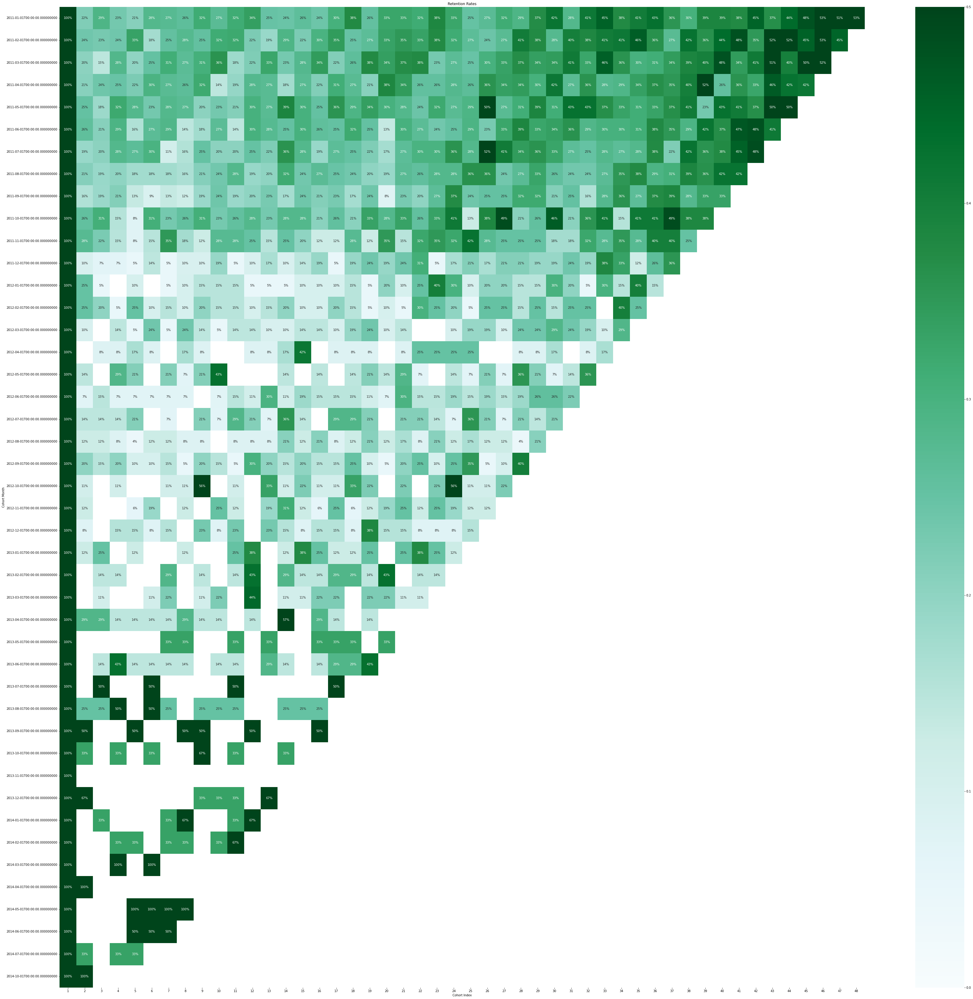

In [191]:
plt.figure(figsize=(60,60))
plt.title("Retention Rates")
sns.heatmap(data=retention, annot=True, fmt=".0%", vmin=0.0, vmax=0.5, cmap="BuGn");

The full chart is difficult to read therefore we will break the cohorts into months in each year.


We will first create a function that calculates the retention rate for each cohort in each year

In [275]:
# define function
def retention_rate(year):
    '''Segments customers into cohorts and calculates retention rate
    
    Input:
    year: year in which customers will be segmented
    
    Output:
    return: heatmap showing the retention rate for each cohort'''
    data = df[['Customer ID','Sales','Order Date']]
    data_year = data[data['Order Date'].dt.year == year]
    data_year["Order Month"] = data_year["Order Date"].apply(get_month)
    grouping =data_year.groupby("Customer ID")["Order Month"]
    data_year["Cohort Month"] = grouping.transform(min)
    invoice_year, invoice_month, _ = get_date_int(data_year, "Order Month")
    cohort_year, cohort_month, _ = get_date_int(data_year, "Cohort Month")
    years_diff = invoice_year - cohort_year
    months_diff = invoice_month - cohort_month
    data_year["CohortIndex"] = years_diff*12 + months_diff + 1
    grouping = data_year.groupby(["Cohort Month", "CohortIndex"])
    cohort_data = grouping['Customer ID'].apply(pd.Series.nunique)
    cohort_data = cohort_data.reset_index()
    cohort_counts = cohort_data.pivot(index="Cohort Month", columns="CohortIndex", values="Customer ID")
    cohort_sizes = cohort_counts.iloc[:, 0]
    retention = cohort_counts.divide(cohort_sizes, axis = 0)
    retention.round(3) *100
    plt.figure(figsize=(10,8))
    plt.title(f'Retention Rates for {year}')
    sns.heatmap(data=retention, annot=True, fmt=".0%", vmin=0.0, vmax=0.5, cmap="BuGn");


## 2011

To perform the cohort analysis for 2011, we will pass 2011 into the function.

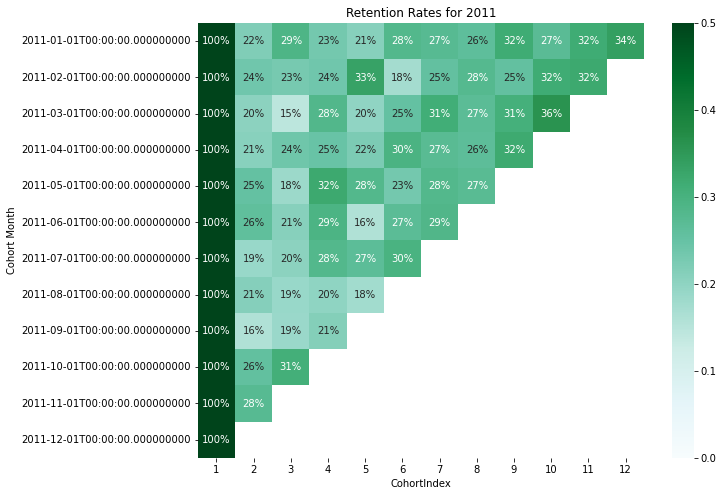

In [276]:
retention_rate(2011)

In [265]:
import warnings
warnings.filterwarnings("ignore")

# 2012 Cohort Analysis

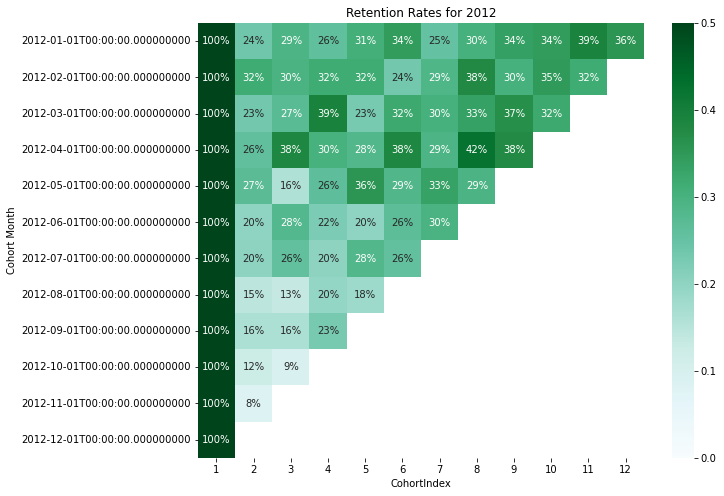

In [277]:
retention_rate(2012)

## 2013 Cohort Analysis

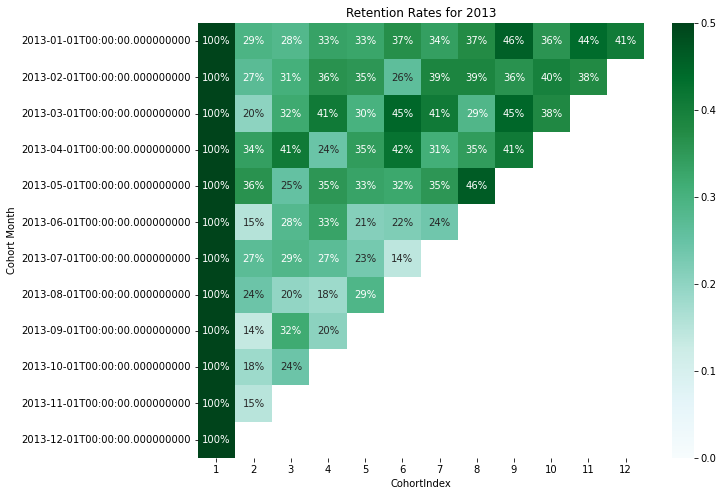

In [278]:
retention_rate(2013)

## 2014 Cohort Analysis

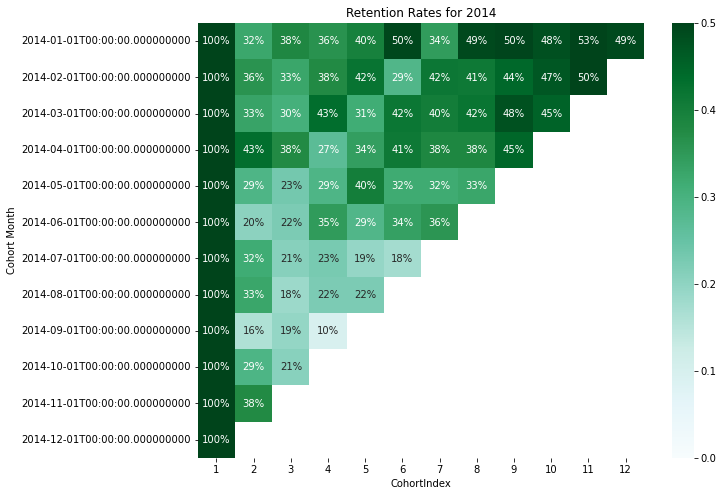

In [279]:
retention_rate(2014)

## RFM Segmentation

Here we base our analysis on 3 things:

1. Recency - how recent the customers' transactions have been

2. Frequency - the customer purchases in the last 12 months

3. Monetary value - how much the customer spent

In [248]:
data.columns

Index(['Customer ID', 'Sales', 'Order Date'], dtype='object')

In [249]:
df['Order Date'] = pd.to_datetime(df['Order Date'])
sales_df['TotalSales'] = sales_df['Quantity']*sales_df['Sales']
sales_df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,City,State,Country,Postal Code,Market,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping Cost,Order Priority,TotalSales
0,42433,AG-2011-2040,1/1/2011,6/1/2011,Standard Class,TB-11280,Toby Braunhardt,Consumer,Constantine,Constantine,Algeria,NaN,Africa,Africa,OFF-TEN-10000025,Office Supplies,Storage,"Tenex Lockers, Blue",408.30,2,0.00,106.14,35.46,Medium,816.60
1,22253,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,Australia,NaN,APAC,Oceania,OFF-SU-10000618,Office Supplies,Supplies,"Acme Trimmer, High Speed",120.37,3,0.10,36.04,9.72,Medium,361.10
2,48883,HU-2011-1220,1/1/2011,5/1/2011,Second Class,AT-735,Annie Thurman,Consumer,Budapest,Budapest,Hungary,NaN,EMEA,EMEA,OFF-TEN-10001585,Office Supplies,Storage,"Tenex Box, Single Width",66.12,4,0.00,29.64,8.17,High,264.48
3,11731,IT-2011-3647632,1/1/2011,5/1/2011,Second Class,EM-14140,Eugene Moren,Home Office,Stockholm,Stockholm,Sweden,NaN,EU,North,OFF-PA-10001492,Office Supplies,Paper,"Enermax Note Cards, Premium",44.87,3,0.50,-26.05,4.82,High,134.59
4,22255,IN-2011-47883,1/1/2011,8/1/2011,Standard Class,JH-15985,Joseph Holt,Consumer,Wagga Wagga,New South Wales,Australia,NaN,APAC,Oceania,FUR-FU-10003447,Furniture,Furnishings,"Eldon Light Bulb, Duo Pack",113.67,5,0.10,37.77,4.70,Medium,568.35


In [250]:
min(sales_df['Order Date'])

'1/1/2011'

In [251]:
max(sales_df['Order Date'])

'9/9/2014'

In [252]:
# adding one more day tp the max order date
snapshot_date = max(df['Order Date']) + dt.timedelta(days=1)
snapshot_date

Timestamp('2015-01-01 00:00:00')

# Calculating the RFM metrics

In [283]:
datamet = sales_df.groupby(['Customer ID']).agg({
    'Order Date': lambda x: (snapshot_date-x.astype('datetime64[ns]').max()).days,
    'Order ID': 'count',
    'TotalSales': 'sum'
}
)

In [284]:
# renaming the column
datamet.rename(columns={
    'Order Date': 'Recency',
    'Order ID': 'Frequency',
    'TotalSales': 'MonetaryValue'
}, inplace = True)

In [285]:
datamet

,Recency,Frequency,MonetaryValue
Customer ID,,,
AA-10315,9,42,56735.25
AA-10375,7,42,23893.64
AA-10480,118,38,89517.10
AA-10645,27,73,72217.61
AA-315,3,8,7865.98
...,...,...,...
YS-21880,10,54,96423.61
ZC-11910,201,1,7.17
ZC-21910,4,84,155687.55


In [286]:
# recency quartile

r_labels = range(4, 0, -1)
r_quartiles = pd.qcut(datamet['Recency'], 4, labels = r_labels)
datamet = datamet.assign(R= r_quartiles.values)
datamet

,Recency,Frequency,MonetaryValue,R
Customer ID,,,,
AA-10315,9,42,56735.25,4
AA-10375,7,42,23893.64,4
AA-10480,118,38,89517.10,1
AA-10645,27,73,72217.61,3
AA-315,3,8,7865.98,4
...,...,...,...,...
YS-21880,10,54,96423.61,4
ZC-11910,201,1,7.17,1
ZC-21910,4,84,155687.55,4


In [287]:
# frequency and monetary quartiles

f_labels = range(1,5)
m_labels = range(1,5)

f_quartiles = pd.qcut(datamet['Frequency'], 4, labels = f_labels)
m_quartiles = pd.qcut(datamet['MonetaryValue'], 4, labels = m_labels)

datamet = datamet.assign(F= f_quartiles.values)
datamet = datamet.assign(M= m_quartiles.values)
datamet

,Recency,Frequency,MonetaryValue,R,F,M
Customer ID,,,,,,
AA-10315,9,42,56735.25,4,3,3
AA-10375,7,42,23893.64,4,3,2
AA-10480,118,38,89517.10,1,3,4
AA-10645,27,73,72217.61,3,4,4
AA-315,3,8,7865.98,4,1,2
...,...,...,...,...,...,...
YS-21880,10,54,96423.61,4,4,4
ZC-11910,201,1,7.17,1,1,1
ZC-21910,4,84,155687.55,4,4,4


## Building RFM Segment and RFM Score


Concatenate the RFM quartile values to RFM_segment
Sum RFM quartiles values to RFM_scores

In [288]:
def join_rfm(x):
    return str(int(x['R'])) + str(int(x['F'])) + str(int(x['M']))

In [289]:
datamet['RFM_Segment'] = datamet.apply(join_rfm, axis=1)
datamet['RFM Score'] = datamet[['R', 'F', 'M']].sum(axis=1)

In [290]:
datamet

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM Score
Customer ID,,,,,,,,
AA-10315,9,42,56735.25,4,3,3,433,10
AA-10375,7,42,23893.64,4,3,2,432,9
AA-10480,118,38,89517.10,1,3,4,134,8
AA-10645,27,73,72217.61,3,4,4,344,11
AA-315,3,8,7865.98,4,1,2,412,7
...,...,...,...,...,...,...,...,...
YS-21880,10,54,96423.61,4,4,4,444,12
ZC-11910,201,1,7.17,1,1,1,111,3
ZC-21910,4,84,155687.55,4,4,4,444,12


In [291]:
datamet.groupby('RFM_Segment').size().sort_values(ascending=False)[:10]

RFM_Segment
111    174
444    105
344     90
433     89
333     88
122     72
222     72
233     71
112     70
244     65
dtype: int64

In [292]:
# filtering on RFM segments
datamet[datamet['RFM_Segment']=='111']

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM Score
Customer ID,,,,,,,,
AC-450,117,10,2187.87,1,1,1,111,3
AH-465,271,7,744.76,1,1,1,111,3
AM-360,116,12,2557.77,1,1,1,111,3
AM-705,137,8,2063.55,1,1,1,111,3
AR-405,223,7,583.54,1,1,1,111,3
...,...,...,...,...,...,...,...,...
VG-11805,136,7,1576.81,1,1,1,111,3
VP-11730,163,9,486.86,1,1,1,111,3
VT-11700,126,11,3916.00,1,1,1,111,3


## Summary Metrics per RFM Score

In [293]:
datamet.groupby('RFM Score').agg(
{
    'Recency': 'mean',
    'Frequency': 'mean',
    'MonetaryValue': ['mean', 'count']
}).round(1)

Recency Frequency MonetaryValue      
             mean      mean          mean count
RFM Score                                      
3          298.70      7.20       1968.60   174
4          178.40     10.10       5975.00   166
5          136.60     14.40       9879.70   161
6           58.90     15.40      11054.20   143
7           38.70     19.40      15813.60   120
8           47.50     33.50      36170.10   140
9           41.90     45.80      56239.90   174
10          29.30     50.90      69275.60   224
11          16.60     58.30      78972.10   183
12           6.80     64.50     100940.00   105

## Grouping into names segments


In [294]:
def segment_me(df):
    if df['RFM Score'] >= 9:
        return 'Gold'
    elif (df['RFM Score']>= 5) and (df['RFM Score']<9):
        return 'Silver'
    else:
        return 'Bronze'

In [295]:
datamet['General_Segment'] = datamet.apply(segment_me, axis=1)
datamet

,Recency,Frequency,MonetaryValue,R,F,M,RFM_Segment,RFM Score,General_Segment
Customer ID,,,,,,,,,
AA-10315,9,42,56735.25,4,3,3,433,10,Gold
AA-10375,7,42,23893.64,4,3,2,432,9,Gold
AA-10480,118,38,89517.10,1,3,4,134,8,Silver
AA-10645,27,73,72217.61,3,4,4,344,11,Gold
AA-315,3,8,7865.98,4,1,2,412,7,Silver
...,...,...,...,...,...,...,...,...,...
YS-21880,10,54,96423.61,4,4,4,444,12,Gold
ZC-11910,201,1,7.17,1,1,1,111,3,Bronze
ZC-21910,4,84,155687.55,4,4,4,444,12,Gold


In [296]:
datamet.groupby('General_Segment').agg(
{
    'Recency': 'mean',
    'Frequency': 'mean',
    'MonetaryValue': ['mean','count']
}).round(1)

Recency Frequency MonetaryValue      
                   mean      mean          mean count
General_Segment                                      
Bronze           240.00      8.60       3924.60   340
Gold              25.70     53.70      73402.40   686
Silver            74.00     20.50      17966.00   564

##### Recency
On the average, it takes Gold customers 26 days from a day of purchase to return for another purchase. It takes Silver customers 74 days from a day of purchase to return for another purchase and it takes Bronze customers 240 days to return.

##### Frequency
On the average over 12 months, Gold customers have made orders as frequently as 54 times while Silver customers have made orders as frequently as 21 times. Bronze customers have made orders as frequently as 9 times over the period.

##### Monetary Value
The superstore makes more sales from Gold customers(73.4k) than from Silver customers (18k) and Bronze customers(3.9k)

The superstore has more Gold customers than Silver and Bronze customers. There are also more Silver customers than bronze customers. This is a good indicator that the superstore has a good retention rate.

### Recommendations

As data analysts, we recommend that for each market, the superstore should incest in the best performing countries in terms of profit and also the best performing product categories and segments. Therefore for each market, the recommendations are;

##### APAC Market
Product Category: Technology and Furniture
Segment: Consumer and Corporate
Country: China, India, Australia, Japan and Bangladesh

##### EU Market
Product Category: Office Supplies and Technology
Segment: Consumer and Corporate
Country: France, Germany, United Kingdom and Italy 

##### US Market
Product Category: Technology and Office Supplies
Segment:Consumer and Corporate
State: California, New York, Washington, Michigan, Virginia, Indiana, Georgia, Kentucky, Minnesota and Delaware

##### EMEA Market
Product Category:Technology and Office Supplies
Segment:Consumer and Corporate
Country: Iran,Russia, Ukraine, Saudi Arabia, Iraq

##### LATAM Market
Product Category: Technology and Furniture
Segment: Consumer and Corporate
Country: Mexico, Brazil, El Salvador, Cuba and Nicaragua

##### Africa Market
Product Category: Technology and Office Supplies
Segment: Consumer, Corporate and Home Office
Country: Morocco, South Africa, Demographic Republic of the Congo, Egypt and Algeria

##### Canada Market
Product Category: Office Supplies and Technology
Segement: Consumer and Corporate 
State: Ontario, Quebec and British Columbia 